# Analyzing the type of housing construction in Highest or High Resource areas of Los Angeles
### Making a case for the lack of, and need for affordable housing production to be directed to high opportunity neighborhoods. The spatial analysis illustrates that even after TCAC maps were created to direct housing production in high resource areas, the affordable housing production in the last 5 years have been concentrated in lower opportunity areas.

### Working with the base dataset, which is the TCAC opportunity map


In [1]:
# importing all geospatial libraries
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx

In [2]:
# read and add shapefile to notebook using url
# tried using shp file but didnt work- ask q
url = "https://www.treasurer.ca.gov/ctcac/opportunity/2023/final_2023_shapefile.zip"
TCAC = gpd.read_file(url)



In [3]:
#data type
type(TCAC)

geopandas.geodataframe.GeoDataFrame

In [4]:
# checking out the data
TCAC.head()

,fips,fips_bg,cnty_nm,countyd,region,ecn_dmn,env_hl_,ed_domn,index,oppcat,geometry
0,06001400100,None,Alameda,06001,Bay Area Region,0.796927,0.927856,0.787575,0.590095,Highest Resource,"POLYGON ((-122.23418 37.85254, -122.23428 37.8..."
1,06001400200,None,Alameda,06001,Bay Area Region,0.960588,0.627255,0.810955,0.701320,Highest Resource,"POLYGON ((-122.25253 37.85110, -122.25094 37.8..."
2,06001400300,None,Alameda,06001,Bay Area Region,0.927188,0.619238,0.324649,0.210942,High Resource,"POLYGON ((-122.26417 37.83787, -122.26427 37.8..."
3,06001400400,None,Alameda,06001,Bay Area Region,0.872411,0.657983,0.523046,0.358539,High Resource,"POLYGON ((-122.26081 37.84869, -122.26023 37.8..."
4,06001400500,None,Alameda,06001,Bay Area Region,0.759519,0.698063,0.566466,0.310218,High Resource,"POLYGON ((-122.26023 37.85274, -122.26081 37.8..."


In [5]:
# no. of rows and columns
TCAC.shape

(10136, 11)

In [6]:
TCAC.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 10136 entries, 0 to 10135
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   fips      10136 non-null  object  
 1   fips_bg   3093 non-null   object  
 2   cnty_nm   10136 non-null  object  
 3   countyd   10136 non-null  object  
 4   region    10136 non-null  object  
 5   ecn_dmn   9747 non-null   float64 
 6   env_hl_   9747 non-null   float64 
 7   ed_domn   9747 non-null   float64 
 8   index     9233 non-null   float64 
 9   oppcat    9747 non-null   object  
 10  geometry  10133 non-null  geometry
dtypes: float64(4), geometry(1), object(6)
memory usage: 871.2+ KB


In [7]:
TCAC.dtypes

fips          object
fips_bg       object
cnty_nm       object
countyd       object
region        object
ecn_dmn      float64
env_hl_      float64
ed_domn      float64
index        float64
oppcat        object
geometry    geometry
dtype: object

In [8]:
TCAC.columns.to_list()

['fips',
 'fips_bg',
 'cnty_nm',
 'countyd',
 'region',
 'ecn_dmn',
 'env_hl_',
 'ed_domn',
 'index',
 'oppcat',
 'geometry']

In [9]:
#seeing only county names
TCAC['cnty_nm'].sample(5)

7597      San Diego
8455    Santa Clara
2463    Los Angeles
7528      San Diego
5956      Riverside
Name: cnty_nm, dtype: object

In [10]:
# listing counties and the number of census tracts in each county
TCAC['cnty_nm'].value_counts()

Los Angeles        2365
San Diego           685
Orange              583
Riverside           509
San Bernardino      472
Santa Clara         378
Alameda             361
Sacramento          335
Fresno              315
Kern                235
Contra Costa        213
Sonoma              197
San Francisco       196
Ventura             195
Butte               195
Tulare              174
San Joaquin         174
San Mateo           172
Stanislaus          159
Monterey            141
Placer              137
Shasta              131
San Luis Obispo     118
Santa Barbara       117
Solano              112
Humboldt            108
Merced               98
El Dorado            92
Santa Cruz           89
Mendocino            79
Nevada               75
Imperial             70
Marin                67
Napa                 63
Sutter               62
Madera               59
Kings                57
Yolo                 51
Yuba                 49
Lake                 48
Tuolumne             48
Tehama          

In [11]:
#trimming data
TCAC.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 10136 entries, 0 to 10135
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   fips      10136 non-null  object  
 1   fips_bg   3093 non-null   object  
 2   cnty_nm   10136 non-null  object  
 3   countyd   10136 non-null  object  
 4   region    10136 non-null  object  
 5   ecn_dmn   9747 non-null   float64 
 6   env_hl_   9747 non-null   float64 
 7   ed_domn   9747 non-null   float64 
 8   index     9233 non-null   float64 
 9   oppcat    9747 non-null   object  
 10  geometry  10133 non-null  geometry
dtypes: float64(4), geometry(1), object(6)
memory usage: 871.2+ KB


In [12]:
#showing desired columns of county name, opportunity and geometry
TCAC[['fips','cnty_nm','oppcat','geometry']]

,fips,cnty_nm,oppcat,geometry
0,06001400100,Alameda,Highest Resource,"POLYGON ((-122.23418 37.85254, -122.23428 37.8..."
1,06001400200,Alameda,Highest Resource,"POLYGON ((-122.25253 37.85110, -122.25094 37.8..."
2,06001400300,Alameda,High Resource,"POLYGON ((-122.26417 37.83787, -122.26427 37.8..."
3,06001400400,Alameda,High Resource,"POLYGON ((-122.26081 37.84869, -122.26023 37.8..."
4,06001400500,Alameda,High Resource,"POLYGON ((-122.26023 37.85274, -122.26081 37.8..."
...,...,...,...,...
10131,06115041000,Yuba,None,"POLYGON ((-121.63631 39.24941, -121.63581 39.2..."
10132,06115041100,Yuba,Moderate Resource,"POLYGON ((-121.27892 39.49773, -121.27724 39.5..."
10133,06115041100,Yuba,Highest Resource,"POLYGON ((-121.32330 39.36354, -121.32129 39.3..."
10134,06115041100,Yuba,Moderate Resource,"POLYGON ((-121.28387 39.46216, -121.27864 39.4..."


In [13]:
#creating a list of desired columns
desired_columns =['fips','cnty_nm','oppcat','geometry']
desired_columns

['fips', 'cnty_nm', 'oppcat', 'geometry']

In [14]:
#trimming data to the 3 desired columns and creating a new dataset
TCAC_cleared = TCAC[desired_columns].copy()
TCAC_cleared

,fips,cnty_nm,oppcat,geometry
0,06001400100,Alameda,Highest Resource,"POLYGON ((-122.23418 37.85254, -122.23428 37.8..."
1,06001400200,Alameda,Highest Resource,"POLYGON ((-122.25253 37.85110, -122.25094 37.8..."
2,06001400300,Alameda,High Resource,"POLYGON ((-122.26417 37.83787, -122.26427 37.8..."
3,06001400400,Alameda,High Resource,"POLYGON ((-122.26081 37.84869, -122.26023 37.8..."
4,06001400500,Alameda,High Resource,"POLYGON ((-122.26023 37.85274, -122.26081 37.8..."
...,...,...,...,...
10131,06115041000,Yuba,None,"POLYGON ((-121.63631 39.24941, -121.63581 39.2..."
10132,06115041100,Yuba,Moderate Resource,"POLYGON ((-121.27892 39.49773, -121.27724 39.5..."
10133,06115041100,Yuba,Highest Resource,"POLYGON ((-121.32330 39.36354, -121.32129 39.3..."
10134,06115041100,Yuba,Moderate Resource,"POLYGON ((-121.28387 39.46216, -121.27864 39.4..."


In [15]:
#filtering to show only los angeles county data
TCAC_cleared.loc[TCAC_cleared['cnty_nm'] == 'Los Angeles']
LA = TCAC_cleared.loc[TCAC_cleared['cnty_nm'] == 'Los Angeles']

In [16]:
LA

,fips,cnty_nm,oppcat,geometry
1858,06037101110,Los Angeles,Moderate Resource,"POLYGON ((-118.28862 34.25591, -118.29104 34.2..."
1859,06037101122,Los Angeles,High Resource,"POLYGON ((-118.27728 34.26196, -118.27742 34.2..."
1860,06037101210,Los Angeles,Moderate Resource,"POLYGON ((-118.28862 34.24861, -118.28968 34.2..."
1861,06037101220,Los Angeles,Moderate Resource,"POLYGON ((-118.27802 34.24961, -118.27712 34.2..."
1862,06037101300,Los Angeles,High Resource,"POLYGON ((-118.27728 34.25991, -118.26529 34.2..."
...,...,...,...,...
4218,06037980030,Los Angeles,None,"POLYGON ((-118.43001 33.91677, -118.42991 33.9..."
4219,06037980031,Los Angeles,None,"POLYGON ((-118.26359 33.70463, -118.27475 33.7..."
4220,06037980033,Los Angeles,None,"POLYGON ((-118.18207 33.72302, -118.20623 33.7..."
4221,06037990200,Los Angeles,None,"POLYGON ((-118.41149 33.79360, -118.41142 33.7..."


In [17]:
LA["geometry"]

1858    POLYGON ((-118.28862 34.25591, -118.29104 34.2...
1859    POLYGON ((-118.27728 34.26196, -118.27742 34.2...
1860    POLYGON ((-118.28862 34.24861, -118.28968 34.2...
1861    POLYGON ((-118.27802 34.24961, -118.27712 34.2...
1862    POLYGON ((-118.27728 34.25991, -118.26529 34.2...
                              ...                        
4218    POLYGON ((-118.43001 33.91677, -118.42991 33.9...
4219    POLYGON ((-118.26359 33.70463, -118.27475 33.7...
4220    POLYGON ((-118.18207 33.72302, -118.20623 33.7...
4221    POLYGON ((-118.41149 33.79360, -118.41142 33.7...
4222    POLYGON ((-118.23194 33.71062, -118.25869 33.7...
Name: geometry, Length: 2365, dtype: geometry

In [18]:
type(LA)

geopandas.geodataframe.GeoDataFrame

<AxesSubplot: >

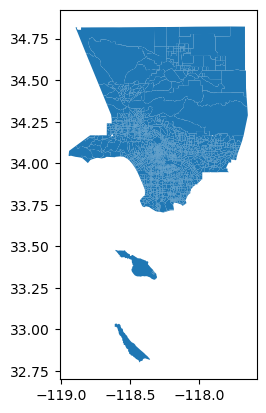

In [19]:
#plotting only LA county
LA.plot()

<AxesSubplot: >

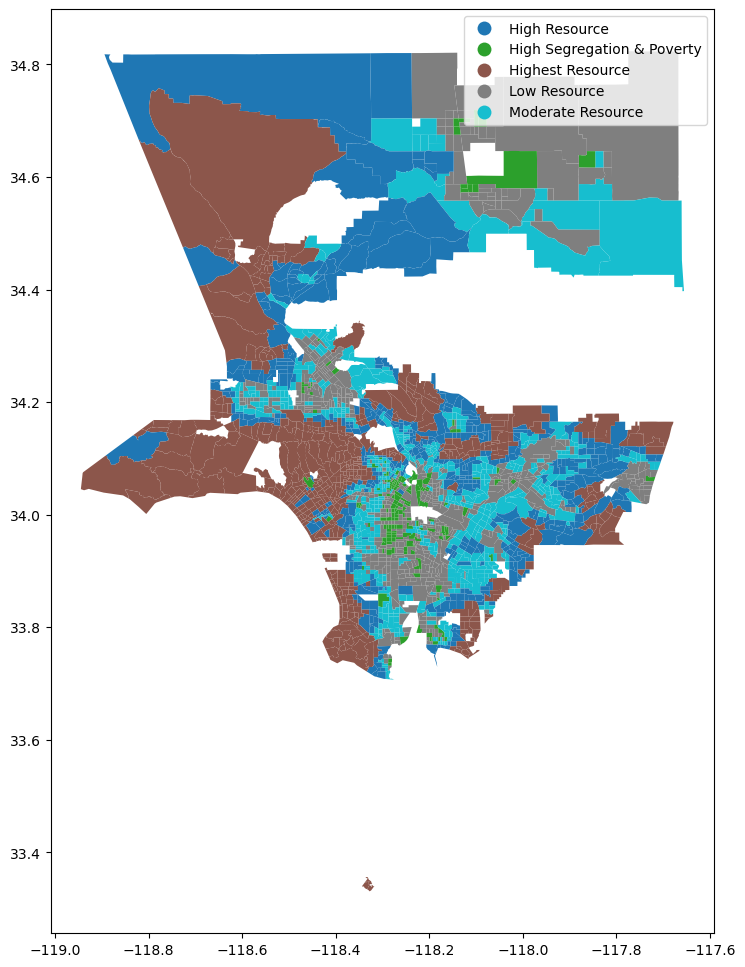

In [20]:
#adding colour to the plot
LA.plot(
            figsize=(20,12),   #size of the plot (a bit bigger than the default). WHAT ARE THE DIMENSION UNITS?
            column = 'oppcat',   # column that defines the color of the dots
            legend = True,     # add a legend           
            legend_kwds={
               'loc': 'upper right',
               'bbox_to_anchor':(1,1), 
            }                  # this puts the legend to the side
    
) 

## Importing a boundary file for the CIty of Los Angeles

In [21]:
#importing city boundary file
zipfile = "data/City_Boundary (1).zip"
cityofla = gpd.read_file(zipfile)

In [22]:
cityofla.head

<bound method NDFrame.head of    OBJECTID CITY                                           geometry
0         1   IN  POLYGON ((-118.42000 34.32917, -118.41948 34.3...>

In [23]:
#making sure its a geodataframe
type(cityofla)

geopandas.geodataframe.GeoDataFrame

In [24]:
citytracts = cityofla.overlay(LA, how='intersection')

In [25]:
#now let's see if that worked
citytracts.info(verbose=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1152 entries, 0 to 1151
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   OBJECTID  1152 non-null   int64   
 1   CITY      1152 non-null   object  
 2   fips      1152 non-null   object  
 3   cnty_nm   1152 non-null   object  
 4   oppcat    1124 non-null   object  
 5   geometry  1152 non-null   geometry
dtypes: geometry(1), int64(1), object(4)
memory usage: 54.1+ KB


In [26]:
#checking the coordinate system
citytracts.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

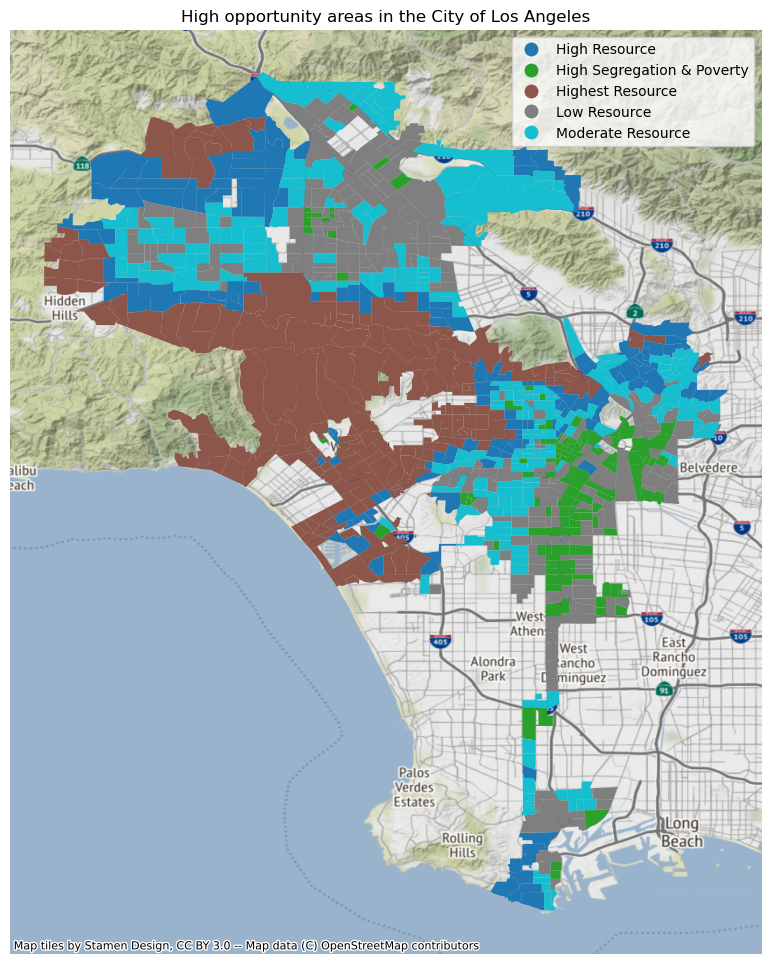

In [27]:
#starting the plot
fig, ax = plt.subplots(figsize=(20,12))



#adding colour to the plot
citytracts.plot(
            ax=ax,   
            column = 'oppcat',   # column that defines the color of the dots
            legend = True,     # add a legend           
            legend_kwds={
               'loc': 'upper right',
               'bbox_to_anchor':(1,1)
            }                  # this puts the legend to the side
) 
# turn the axes off
ax.axis('off')

# give it a title
ax.set_title('High opportunity areas in the City of Los Angeles')

# add a basemap
ctx.add_basemap(ax, crs=4326) 

In [28]:
#finding unique values in the oppcat column
citytracts.oppcat.unique()

array(['Moderate Resource', 'High Resource', 'Low Resource',
       'High Segregation & Poverty', 'Highest Resource', None],
      dtype=object)

In [29]:
#assigning colors to each oppcat category and creating a color column
citytracts.loc[citytracts['oppcat'] == 'Highest Resource', 'color'] = '#93b9c6ff'
citytracts.loc[citytracts['oppcat'] == 'High Resource', 'color'] = '#aed0d9ff'
citytracts.loc[citytracts['oppcat'] == 'Moderate Resource', 'color'] = '#FFFFFF'
citytracts.loc[citytracts['oppcat'] == 'Low Resource', 'color'] = '#FFFFFF'
citytracts.loc[citytracts['oppcat'] == 'High Segregation & Poverty', 'color'] = '#FFFFFF'

In [30]:
citytracts.sample(10)

,OBJECTID,CITY,fips,cnty_nm,oppcat,geometry,color
555,1,IN,06037208710,Los Angeles,High Resource,"POLYGON ((-118.28410 34.06367, -118.28430 34.0...",#aed0d9ff
1022,1,IN,06037532400,Los Angeles,None,"MULTIPOLYGON (((-118.20067 34.01366, -118.2009...",NaN
984,1,IN,06037297601,Los Angeles,Moderate Resource,"MULTIPOLYGON (((-118.27476 33.70665, -118.2747...",#FFFFFF
547,1,IN,06037208301,Los Angeles,High Segregation & Poverty,"POLYGON ((-118.26561 34.06456, -118.26375 34.0...",#FFFFFF
497,1,IN,06037201302,Los Angeles,High Resource,"POLYGON ((-118.17801 34.10311, -118.17801 34.1...",#aed0d9ff
1013,1,IN,06037480703,Los Angeles,Highest Resource,"POLYGON ((-118.16018 34.09867, -118.15922 34.0...",#93b9c6ff
436,1,IN,06037191610,Los Angeles,Moderate Resource,"POLYGON ((-118.30918 34.09077, -118.30658 34.0...",#FFFFFF
434,1,IN,06037191420,Los Angeles,Moderate Resource,"POLYGON ((-118.28446 34.08359, -118.28683 34.0...",#FFFFFF
761,1,IN,06037236203,Los Angeles,High Segregation & Poverty,"POLYGON ((-118.34314 34.01600, -118.34391 34.0...",#FFFFFF
290,1,IN,06037134800,Los Angeles,Moderate Resource,"POLYGON ((-118.56223 34.19104, -118.56223 34.1...",#FFFFFF


In [31]:
citytracts.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1152 entries, 0 to 1151
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   OBJECTID  1152 non-null   int64   
 1   CITY      1152 non-null   object  
 2   fips      1152 non-null   object  
 3   cnty_nm   1152 non-null   object  
 4   oppcat    1124 non-null   object  
 5   geometry  1152 non-null   geometry
 6   color     1124 non-null   object  
dtypes: geometry(1), int64(1), object(5)
memory usage: 63.1+ KB


In [32]:
#counting number of census tracts under each opportunity category
citytracts.groupby('oppcat').count()

,OBJECTID,CITY,fips,cnty_nm,geometry,color
oppcat,,,,,,
High Resource,181,181,181,181,181,181
High Segregation & Poverty,127,127,127,127,127,127
Highest Resource,247,247,247,247,247,247
Low Resource,304,304,304,304,304,304
Moderate Resource,265,265,265,265,265,265


In [33]:
#trying to see if oppcat has any NaN values, because of which the map wasn't plotting based on the color column
citytracts['oppcat'].isnull().values.any()


True

In [34]:
#dropping rows with NaN values
citytracts.dropna(subset=['oppcat'], how='all', inplace=True)

/opt/conda/lib/python3.10/site-packages/geopandas/plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


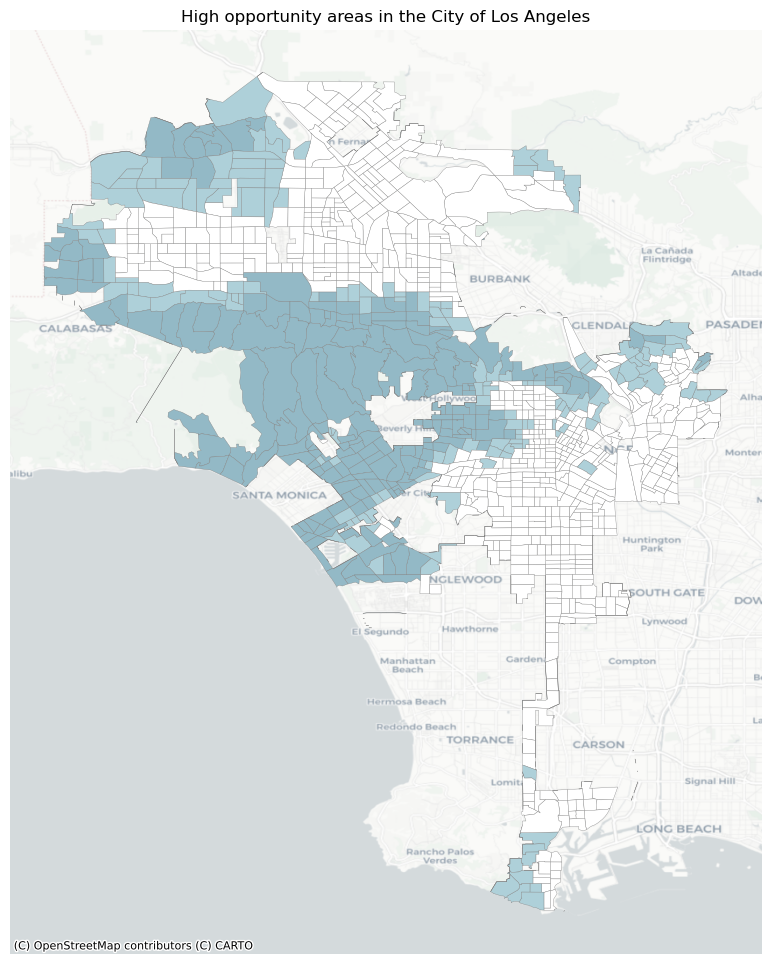

In [35]:
#plotting with assigned colours
#starting the plot
fig, ax = plt.subplots(figsize=(20,12))

#adding colour to the plot
citytracts.plot(
            ax=ax,   
            column = 'oppcat',   # column that defines the color of the dots
            color = citytracts['color'], #to color according to the TCAC values, based on a new column
            legend = True,     # add a legend        
            
            edgecolor = 'grey',
            linewidth = 0.25,
            legend_kwds={
               'loc': 'upper right',
               'bbox_to_anchor':(1,1),
            }
        
            )
          
# turn the axes off
ax.axis('off')

# give it a title
ax.set_title('High opportunity areas in the City of Los Angeles')

# add a basemap
ctx.add_basemap(ax,crs=4326,source=ctx.providers.CartoDB.Positron)

In [36]:
#keeping only high and highest resource census tracts
citytracts.loc[citytracts['oppcat'].isin(['High Resource','Highest Resource'])].sample(5)

,OBJECTID,CITY,fips,cnty_nm,oppcat,geometry,color
841,1,IN,06037264301,Los Angeles,Highest Resource,"POLYGON ((-118.45923 34.05079, -118.45923 34.0...",#93b9c6ff
1099,1,IN,06037701000,Los Angeles,Highest Resource,"MULTIPOLYGON (((-118.39997 34.05690, -118.3997...",#93b9c6ff
328,1,IN,06037139802,Los Angeles,Highest Resource,"POLYGON ((-118.56617 34.13765, -118.56889 34.1...",#93b9c6ff
480,1,IN,06037197500,Los Angeles,High Resource,"POLYGON ((-118.25929 34.06894, -118.25980 34.0...",#aed0d9ff
1001,1,IN,06037311700,Los Angeles,Highest Resource,"MULTIPOLYGON (((-118.31033 34.16077, -118.3102...",#93b9c6ff


In [37]:
TCAC_trimmed = citytracts.loc[citytracts['oppcat'].isin(['High Resource','Highest Resource'])].copy()
TCAC_trimmed.sample(5)

,OBJECTID,CITY,fips,cnty_nm,oppcat,geometry,color
348,1,IN,06037143700,Los Angeles,Highest Resource,"POLYGON ((-118.36169 34.13882, -118.36166 34.1...",#93b9c6ff
1126,1,IN,06037800506,Los Angeles,Highest Resource,"MULTIPOLYGON (((-118.56715 34.04141, -118.5671...",#93b9c6ff
554,1,IN,06037208620,Los Angeles,High Resource,"POLYGON ((-118.27888 34.06625, -118.27923 34.0...",#aed0d9ff
883,1,IN,06037270100,Los Angeles,Highest Resource,"POLYGON ((-118.38777 34.02907, -118.38817 34.0...",#93b9c6ff
980,1,IN,06037297202,Los Angeles,High Resource,"POLYGON ((-118.30343 33.72158, -118.30343 33.7...",#aed0d9ff


In [38]:
# converting the data to a neighborhood scale
neighborhoods = gpd.read_file("https://services5.arcgis.com/7nsPwEMP38bSkCjy/arcgis/rest/services/LA_Times_Neighborhoods/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson")

In [39]:
#seeing the neighborhoods data
neighborhoods.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 114 entries, 0 to 113
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   OBJECTID  114 non-null    int64   
 1   name      114 non-null    object  
 2   geometry  114 non-null    geometry
dtypes: geometry(1), int64(1), object(1)
memory usage: 2.8+ KB


In [40]:
neighborhoods.head()

,OBJECTID,name,geometry
0,1,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0..."
1,2,Arleta,"POLYGON ((-118.44255 34.26412, -118.44240 34.2..."
2,3,Arlington Heights,"POLYGON ((-118.31862 34.05306, -118.31673 34.0..."
3,4,Atwater Village,"MULTIPOLYGON (((-118.27886 34.15321, -118.2788..."
4,5,Baldwin Hills/Crenshaw,"POLYGON ((-118.36102 34.02532, -118.36026 34.0..."


/opt/conda/lib/python3.10/site-packages/geopandas/plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


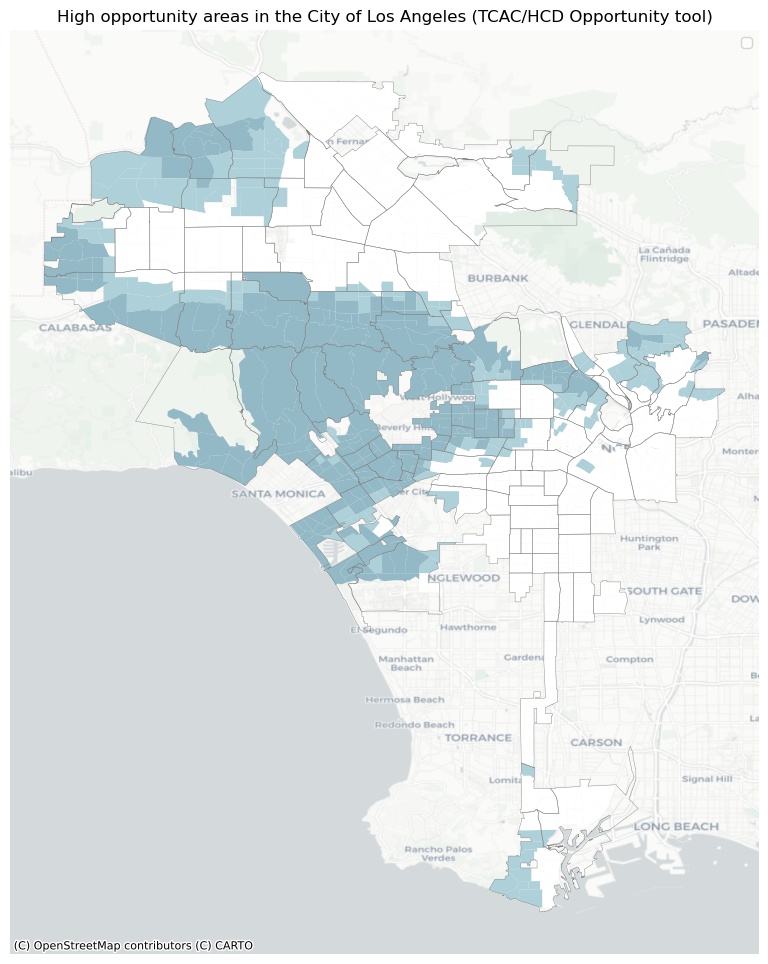

In [41]:
#plotting with neighborhood boundaries
#starting the plot
fig, ax = plt.subplots(figsize=(20,12))



#adding colour to the plot
citytracts.plot(
            ax=ax,   
            column = 'oppcat',   # column that defines the color of the dots
            color = citytracts['color'], #to color according to the TCAC values, based on a new column
            legend = True,     # add a legend        
            legend_kwds={
               'loc': 'upper right',
               'bbox_to_anchor':(2,2),
            }
        
            )
neighborhoods.plot(
            ax=ax,                
            color = "none",        
            edgecolor = 'grey',
            linewidth = 0.3,
            )
          
    
ax.legend()
    
# turn the axes off
ax.axis('off')

# give it a title
ax.set_title('High opportunity areas in the City of Los Angeles (TCAC/HCD Opportunity tool)')

# add a basemap at 40% transparency
ctx.add_basemap(ax,crs=4326,source=ctx.providers.CartoDB.Positron)

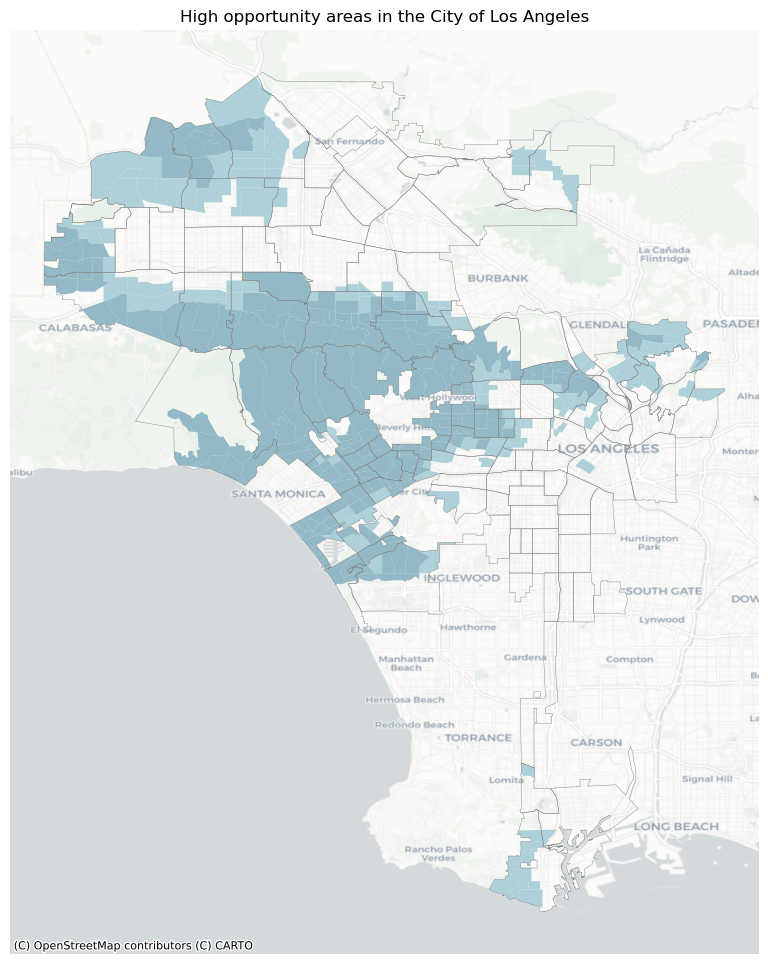

In [42]:
#plotting with neighborhood boundaries
#starting the plot
fig, ax = plt.subplots(figsize=(20,12))



#adding colour to the plot
TCAC_trimmed.plot(
            ax=ax,   
            column = 'oppcat',   # column that defines the color of the dots
            color = TCAC_trimmed['color'], #to color according to the TCAC values, based on a new column
            legend = True,     # add a legend        
            legend_kwds={
               'loc': 'upper right',
               'bbox_to_anchor':(1,1),
            }
        
            )
neighborhoods.plot(
            ax=ax,                
            color = "none",        
            edgecolor = 'grey',
            linewidth = 0.3,
            )
          
    
    
# turn the axes off
ax.axis('off')

# give it a title
ax.set_title('High opportunity areas in the City of Los Angeles')

# add a basemap at 40% transparency
ctx.add_basemap(ax,crs=4326,source=ctx.providers.CartoDB.Positron)

## Analyzing affordable housing development in high resource areas

### Using the TCAC map as the base map and overlaying with affordable housing data to understand spatial housing spegregation. This is done using the permit data

In [43]:
#importing building permit data to then filter projects built in the last 5 years
#additional column inserted AFFD where NOAH = no affordable housing, and AH = affordable housing, based on work description
newunits = pd.read_csv ("data/AFFD_Building_Permits__New_Housing_Units_AFFD (1).csv")

/tmp/ipykernel_305/3937401815.py:3: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  newunits = pd.read_csv ("data/AFFD_Building_Permits__New_Housing_Units_AFFD (1).csv")


In [44]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
newunits.head()

,Assessor Book,Assessor Page,Assessor Parcel,Tract,Block,Lot,Reference # (Old Permit #),PCIS Permit #,Permit Type,Permit Sub-Type,Permit Category,Project Number,Event Code,Initiating Office,Issue Date,Address Start,Address Fraction Start,Address End,Address Fraction End,Street Direction,Street Name,Street Suffix,Suffix Direction,Unit Range Start,Unit Range End,Zip Code,Work Description,AFFD,Valuation,Floor Area-L.A. Zoning Code Definition,# of Residential Dwelling Units,# of Stories,Contractor's Business Name,Contractor Address,Contractor City,Contractor State,License Type,License #,Principal First Name,Principal Middle Name,Principal Last Name,License Expiration Date,Applicant First Name,Applicant Last Name,Applicant Business Name,Applicant Address 1,Applicant Address 2,Applicant Address 3,Zone,Occupancy,Floor Area-L.A. Building Code Definition,Census Tract,Latitude,Longitude
0,4211.0,27,6,TR 49104-06-C,NaN,19,19WL99310,19010-30000-00548,Bldg-New,1 or 2 Family Dwelling,Plan Check,NaN,NaN,WEST LA,5/31/2019,6500,NaN,6500,NaN,S,SEABLUFF,DR,NaN,NaN,NaN,90094.0,Three story single family dwelling with attcah...,NOAH,401000.0,3664.0,1,3.0,OWNER-BUILDER,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,1/1/2000,SHANNON,NONN,NaN,NaN,NaN,NaN,R4(PV),NaN,4443.0,2756.02,33.97210,-118.42177
1,5420.0,15,20,"BLOCKS NO'S. 11, 12, 13, 14, 15, 16, 17, 18, 1...",21,18,21LA01334,19010-10000-06113,Bldg-New,1 or 2 Family Dwelling,Plan Check,NaN,NaN,METRO,9/30/2021,1950,NaN,1950,NaN,N,VESTAL,AVE,NaN,NaN,NaN,90026.0,NEW 3-STORY SINGLE FAMILY RESIDENCE - 2389 SQF...,NOAH,298625.0,2389.0,1,3.0,TOSTY'S CONSTRUCTION,3455 CATTARAUGUS AVE,CULVER CITY,CA,B,550499,JOSE,ASUNCION,TOSTADO,6/30/2023,CASEY,HUGHES,NaN,NaN,NaN,NaN,RD2-1VL,NaN,2389.0,1974.10,34.08801,-118.25256
2,2673.0,6,45,TR 74704,NaN,1,21ON 2734,18010-20000-01399,Bldg-New,1 or 2 Family Dwelling,Plan Check,NaN,NaN,VAN NUYS,1/22/2021,15827,NaN,15827,NaN,W,NAPA,ST,NaN,NaN,NaN,91343.0,"NEW 34'-0"" x 47'-4"" TWO-STORY SINGLE FAMILY DW...",NOAH,260000.0,2217.0,1,2.0,OWNER-BUILDER,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,1/1/2000,CURT,NaN,NaN,SAME AS ARCH,NaN,CALABASAS,(T)(Q)R1-1,NaN,2631.0,1174.04,34.22664,-118.47725
3,4362.0,3,43,TR 7656,6,9,17VN34261,14010-10001-03040,Bldg-Addition,1 or 2 Family Dwelling,Plan Check,NaN,NaN,METRO,2/1/2017,627,NaN,627,NaN,N,CARCASSONNE,ROAD,NaN,NaN,NaN,90077.0,1.) SUPPLEMENTAL TO 14010-30000-03040 FOR CHAN...,NOAH,500000.0,20381.0,1,2.0,OWNER-BUILDER,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,ANDREW,ODOM,NaN,10960 WILSHIRE BLVD.,#1510,"LOS ANGELES, CA.",RE40-1-H,NaN,5823.0,2621.00,NaN,NaN
4,2673.0,6,49,TR 74704,NaN,5,21ON 2735,18010-20000-01403,Bldg-New,1 or 2 Family Dwelling,Plan Check,NaN,NaN,VAN NUYS,1/22/2021,15803,NaN,15803,NaN,W,NAPA,ST,NaN,NaN,NaN,91343.0,"NEW 34'-0"" x 47'-6"" TWO-STORY SINGLE FAMILY DW...",NOAH,260000.0,2217.0,1,2.0,OWNER-BUILDER,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,1/1/2000,CURT,NaN,NaN,SAME AS ARCH,NaN,CALABASAS,(T)(Q)R1-1,NaN,2631.0,1174.04,34.22664,-118.47668


In [45]:
newunits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25062 entries, 0 to 25061
Data columns (total 54 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   Assessor Book                             25029 non-null  float64
 1   Assessor Page                             25029 non-null  object 
 2   Assessor Parcel                           25029 non-null  object 
 3   Tract                                     24956 non-null  object 
 4   Block                                     5435 non-null   object 
 5   Lot                                       24953 non-null  object 
 6   Reference # (Old Permit #)                25049 non-null  object 
 7   PCIS Permit #                             25062 non-null  object 
 8   Permit Type                               25062 non-null  object 
 9   Permit Sub-Type                           25062 non-null  object 
 10  Permit Category                   

In [46]:
# seeing which columns have a zero value
newunits.columns[newunits.isna().all()].tolist()

['Event Code']

In [47]:
#checking the type of permits in newunits
newunits['Permit Type'].value_counts()

Bldg-New             22551
Bldg-Alter/Repair     1472
Bldg-Addition         1011
Fire Sprinkler           7
Nonbldg-New              6
Bldg-Relocation          5
Plumbing                 4
Grading                  2
Bldg-Demolition          1
Electrical               1
Elevator                 1
HVAC                     1
Name: Permit Type, dtype: int64

In [48]:
#renaming column to LatLont to remove special characters
newunits.rename(columns={'Latitude/Longitude':'LatLong'}, inplace=True)

In [49]:
newunits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25062 entries, 0 to 25061
Data columns (total 54 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   Assessor Book                             25029 non-null  float64
 1   Assessor Page                             25029 non-null  object 
 2   Assessor Parcel                           25029 non-null  object 
 3   Tract                                     24956 non-null  object 
 4   Block                                     5435 non-null   object 
 5   Lot                                       24953 non-null  object 
 6   Reference # (Old Permit #)                25049 non-null  object 
 7   PCIS Permit #                             25062 non-null  object 
 8   Permit Type                               25062 non-null  object 
 9   Permit Sub-Type                           25062 non-null  object 
 10  Permit Category                   

In [50]:
#showing a subset of columns required for analysis
newunits[['Tract','Permit Type','Permit Sub-Type','Issue Date','# of Residential Dwelling Units','AFFD','Zone','Census Tract','Latitude','Longitude']].head()

,Tract,Permit Type,Permit Sub-Type,Issue Date,# of Residential Dwelling Units,AFFD,Zone,Census Tract,Latitude,Longitude
0,TR 49104-06-C,Bldg-New,1 or 2 Family Dwelling,5/31/2019,1,NOAH,R4(PV),2756.02,33.97210,-118.42177
1,"BLOCKS NO'S. 11, 12, 13, 14, 15, 16, 17, 18, 1...",Bldg-New,1 or 2 Family Dwelling,9/30/2021,1,NOAH,RD2-1VL,1974.10,34.08801,-118.25256
2,TR 74704,Bldg-New,1 or 2 Family Dwelling,1/22/2021,1,NOAH,(T)(Q)R1-1,1174.04,34.22664,-118.47725
3,TR 7656,Bldg-Addition,1 or 2 Family Dwelling,2/1/2017,1,NOAH,RE40-1-H,2621.00,NaN,NaN
4,TR 74704,Bldg-New,1 or 2 Family Dwelling,1/22/2021,1,NOAH,(T)(Q)R1-1,1174.04,34.22664,-118.47668


In [51]:
#creating  new dataset with trimmed columns
newunits_trimmed = newunits[['Tract','Permit Type','Permit Sub-Type','Issue Date','# of Residential Dwelling Units','AFFD','Zone','Census Tract','Latitude','Longitude']]
newunits_trimmed.head()

,Tract,Permit Type,Permit Sub-Type,Issue Date,# of Residential Dwelling Units,AFFD,Zone,Census Tract,Latitude,Longitude
0,TR 49104-06-C,Bldg-New,1 or 2 Family Dwelling,5/31/2019,1,NOAH,R4(PV),2756.02,33.97210,-118.42177
1,"BLOCKS NO'S. 11, 12, 13, 14, 15, 16, 17, 18, 1...",Bldg-New,1 or 2 Family Dwelling,9/30/2021,1,NOAH,RD2-1VL,1974.10,34.08801,-118.25256
2,TR 74704,Bldg-New,1 or 2 Family Dwelling,1/22/2021,1,NOAH,(T)(Q)R1-1,1174.04,34.22664,-118.47725
3,TR 7656,Bldg-Addition,1 or 2 Family Dwelling,2/1/2017,1,NOAH,RE40-1-H,2621.00,NaN,NaN
4,TR 74704,Bldg-New,1 or 2 Family Dwelling,1/22/2021,1,NOAH,(T)(Q)R1-1,1174.04,34.22664,-118.47668


In [52]:
#seeing the trimmed dataset
newunits_trimmed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25062 entries, 0 to 25061
Data columns (total 10 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Tract                            24956 non-null  object 
 1   Permit Type                      25062 non-null  object 
 2   Permit Sub-Type                  25062 non-null  object 
 3   Issue Date                       25062 non-null  object 
 4   # of Residential Dwelling Units  25062 non-null  int64  
 5   AFFD                             25062 non-null  object 
 6   Zone                             25031 non-null  object 
 7   Census Tract                     25060 non-null  float64
 8   Latitude                         19701 non-null  float64
 9   Longitude                        19701 non-null  float64
dtypes: float64(3), int64(1), object(6)
memory usage: 1.9+ MB


In [53]:
#removing all the rows with missing data (NaN)
newunits_trimmed.dropna(subset=['Latitude'], how='all', inplace=True)

/tmp/ipykernel_305/2961966266.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  newunits_trimmed.dropna(subset=['Latitude'], how='all', inplace=True)


In [54]:
#checking the dataset again
newunits_trimmed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19701 entries, 0 to 25061
Data columns (total 10 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Tract                            19636 non-null  object 
 1   Permit Type                      19701 non-null  object 
 2   Permit Sub-Type                  19701 non-null  object 
 3   Issue Date                       19701 non-null  object 
 4   # of Residential Dwelling Units  19701 non-null  int64  
 5   AFFD                             19701 non-null  object 
 6   Zone                             19675 non-null  object 
 7   Census Tract                     19699 non-null  float64
 8   Latitude                         19701 non-null  float64
 9   Longitude                        19701 non-null  float64
dtypes: float64(3), int64(1), object(6)
memory usage: 1.7+ MB


In [55]:
newunits_trimmed.sample(5)

,Tract,Permit Type,Permit Sub-Type,Issue Date,# of Residential Dwelling Units,AFFD,Zone,Census Tract,Latitude,Longitude
24405,TR 2170,Bldg-New,Apartment,8/14/2015,46,NOAH,R4-1VL,1254.01,34.16205,-118.37722
13903,TR 5713,Bldg-New,1 or 2 Family Dwelling,10/27/2015,1,NOAH,R1-1,2690.00,34.03857,-118.40189
10757,TR 5855,Bldg-Addition,1 or 2 Family Dwelling,7/11/2017,1,NOAH,RD1.5-1,2702.00,34.03267,-118.38069
4871,TR 11896,Bldg-New,1 or 2 Family Dwelling,3/23/2016,1,NOAH,(T)(Q)RD3-1-RIO,1320.01,34.19365,-118.51090
21585,WESTERN AVENUE SQUARE,Bldg-New,1 or 2 Family Dwelling,3/30/2016,2,NOAH,R2-1,2324.00,34.00223,-118.31120


In [56]:
#importing shapely files to convert LatLng into a geometry points
from geopandas import GeoDataFrame
from shapely.geometry import Point 
# Shapely for converting latitude/longtitude to geometry

In [57]:
# convert lat/lon's to floats
newunits_trimmed['Latitude'] = newunits_trimmed['Latitude'].astype(float)
newunits_trimmed['Longitude'] = newunits_trimmed['Longitude'].astype(float)
newunits_trimmed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19701 entries, 0 to 25061
Data columns (total 10 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Tract                            19636 non-null  object 
 1   Permit Type                      19701 non-null  object 
 2   Permit Sub-Type                  19701 non-null  object 
 3   Issue Date                       19701 non-null  object 
 4   # of Residential Dwelling Units  19701 non-null  int64  
 5   AFFD                             19701 non-null  object 
 6   Zone                             19675 non-null  object 
 7   Census Tract                     19699 non-null  float64
 8   Latitude                         19701 non-null  float64
 9   Longitude                        19701 non-null  float64
dtypes: float64(3), int64(1), object(6)
memory usage: 1.7+ MB


/tmp/ipykernel_305/2321521952.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  newunits_trimmed['Latitude'] = newunits_trimmed['Latitude'].astype(float)
/tmp/ipykernel_305/2321521952.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  newunits_trimmed['Longitude'] = newunits_trimmed['Longitude'].astype(float)


In [58]:
# convert df to gdf
# since data is in lat/lon's assign the crs to WGS84 (epsg:4326)
gdf_newunits = gpd.GeoDataFrame(newunits_trimmed, 
                       crs='epsg:4326',
                       geometry=gpd.points_from_xy(newunits_trimmed.Longitude, newunits_trimmed.Latitude))

In [59]:
gdf_newunits.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 19701 entries, 0 to 25061
Data columns (total 11 columns):
 #   Column                           Non-Null Count  Dtype   
---  ------                           --------------  -----   
 0   Tract                            19636 non-null  object  
 1   Permit Type                      19701 non-null  object  
 2   Permit Sub-Type                  19701 non-null  object  
 3   Issue Date                       19701 non-null  object  
 4   # of Residential Dwelling Units  19701 non-null  int64   
 5   AFFD                             19701 non-null  object  
 6   Zone                             19675 non-null  object  
 7   Census Tract                     19699 non-null  float64 
 8   Latitude                         19701 non-null  float64 
 9   Longitude                        19701 non-null  float64 
 10  geometry                         19701 non-null  geometry
dtypes: float64(3), geometry(1), int64(1), object(6)
memory usag

In [60]:
gdf_newunits.sample(5)

,Tract,Permit Type,Permit Sub-Type,Issue Date,# of Residential Dwelling Units,AFFD,Zone,Census Tract,Latitude,Longitude,geometry
17018,P M 4351,Bldg-New,1 or 2 Family Dwelling,10/3/2018,1,NOAH,RE11-1,1113.02,34.25117,-118.51137,POINT (-118.51137 34.25117)
6447,HIGHLAND TRACT ADDITION NO. 1,Bldg-New,1 or 2 Family Dwelling,6/19/2018,1,NOAH,RD1.5-1,2084.02,34.06718,-118.26611,POINT (-118.26611 34.06718)
18703,STRONG AND DICKINSON'S WOODLAWN TRACT,Bldg-New,1 or 2 Family Dwelling,3/27/2013,2,NOAH,R2-1,2284.10,34.01297,-118.27302,POINT (-118.27302 34.01297)
5061,TR 5933,Bldg-New,1 or 2 Family Dwelling,2/9/2017,1,NOAH,[Q]RD1.5-1XL-O,2944.10,33.79397,-118.28976,POINT (-118.28976 33.79397)
23421,TR 5794,Bldg-New,Apartment,2/1/2017,9,NOAH,R3-1-HPOZ,1838.20,34.10420,-118.20184,POINT (-118.20184 34.10420)


<AxesSubplot: >

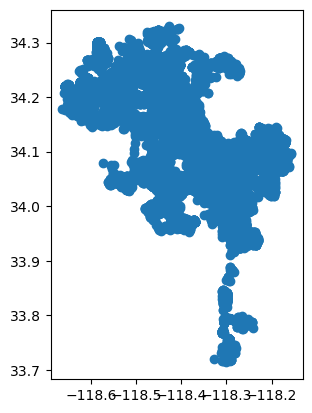

In [61]:
gdf_newunits.plot()

<AxesSubplot: >

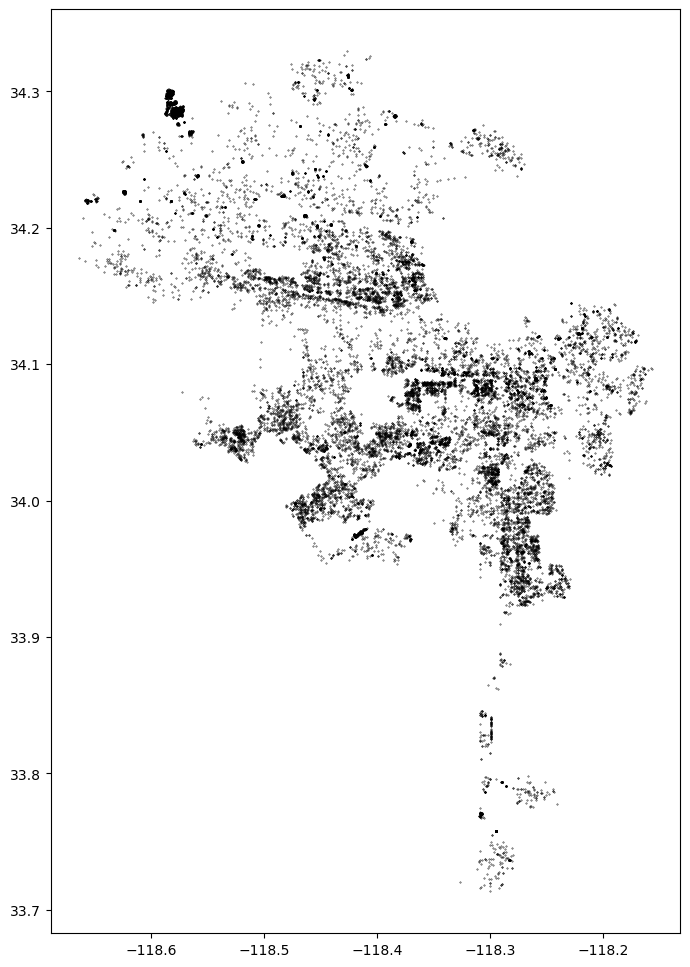

In [62]:
#making a prettier plot
gdf_newunits.plot(
            figsize=(20,12),   
            markersize = 0.1, 
            color = 'black',
            legend = True,     # add a legend           
            legend_kwds={
               'loc': 'upper right',
               'bbox_to_anchor':(1,1)
            }                  # this puts the legend to the side
) 

/opt/conda/lib/python3.10/site-packages/geopandas/plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


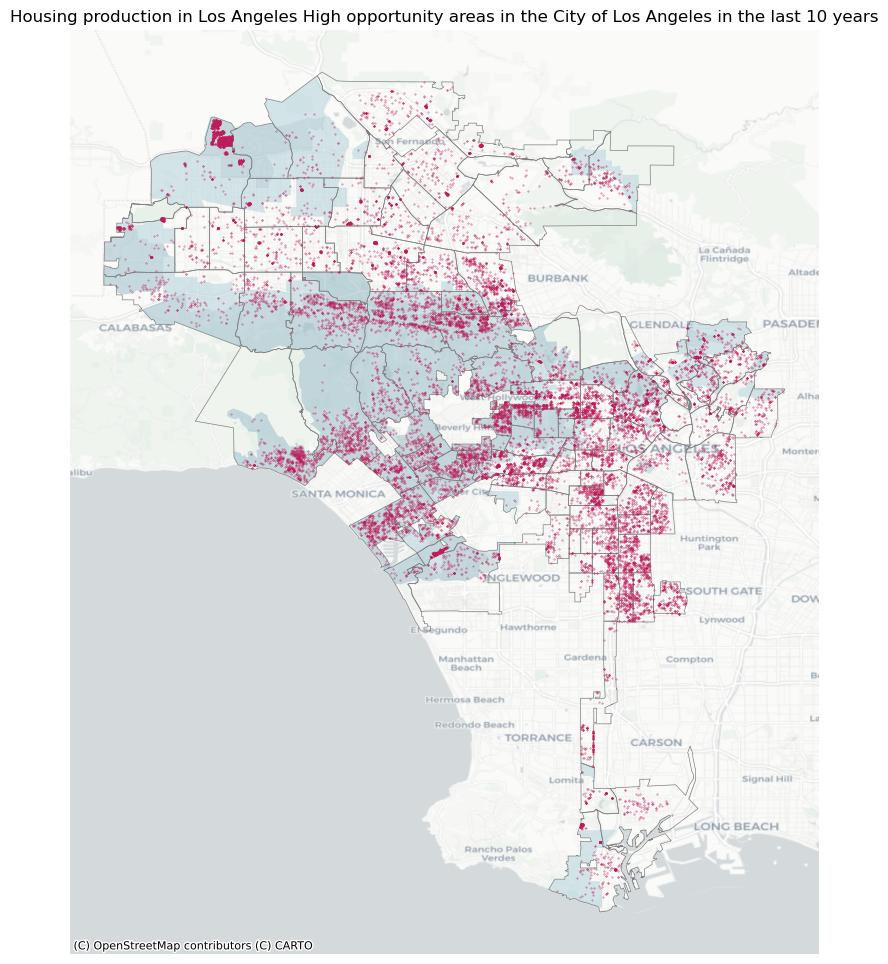

In [63]:
#now trying to map it all together
#plotting with neighborhood boundaries
#starting the plot
fig, ax = plt.subplots(figsize=(20,12))



#adding colour to the plot
TCAC_trimmed.plot(
            ax=ax,   
            column = 'oppcat',   # column that defines the color of the dots
            color = TCAC_trimmed['color'], #to color according to the TCAC values, based on a new column
            legend = True,     # add a legend        
            alpha = 0.5,
            legend_kwds={
               'loc': 'upper right',
               'bbox_to_anchor':(1,1),
            }
        
            )
neighborhoods.plot(
            ax=ax,                
            color = "none",        
            edgecolor = 'grey',
            linewidth = 0.5,
            )
          
gdf_newunits.plot(
            ax=ax,   
            markersize = 0.1,
            alpha = 0.8,
            color = '#bc1d59ff',
            legend = True,     # add a legend 
            legend_kwds={
               'loc': 'upper right',
               'bbox_to_anchor':(1,1),
                'labels':'Housing units',
            }                  # this puts the legend to the side
) 
    
# turn the axes off
ax.axis('off')

# give it a title
ax.set_title('Housing production in Los Angeles High opportunity areas in the City of Los Angeles in the last 10 years')

# add a basemap at 40% transparency
ctx.add_basemap(ax,crs=4326,source=ctx.providers.CartoDB.Positron)



In [64]:
# to get new units after 2016, we need to convert the data type to datetime64 format
import datetime 
newunits_trimmed['Issue Date']=pd.to_datetime(newunits_trimmed['Issue Date'], format='%m/%d/%Y')

/tmp/ipykernel_305/3278880491.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  newunits_trimmed['Issue Date']=pd.to_datetime(newunits_trimmed['Issue Date'], format='%m/%d/%Y')


In [65]:
#filtering newunits after 2016
newunits_2016 = newunits_trimmed.loc[(newunits_trimmed['Issue Date'] > '12/31/2015') & (newunits_trimmed['Issue Date'] <'1/1/2023')]
newunits_2016.sample(10)

,Tract,Permit Type,Permit Sub-Type,Issue Date,# of Residential Dwelling Units,AFFD,Zone,Census Tract,Latitude,Longitude,geometry
8646,TR 3579,Bldg-New,1 or 2 Family Dwelling,2017-11-01,1,NOAH,RD2-1-CDO,1864.04,34.10787,-118.23743,POINT (-118.23743 34.10787)
22813,TR 6006,Bldg-New,Apartment,2022-11-03,4,NOAH,RD1.5-1-O,2167.00,34.05215,-118.37546,POINT (-118.37546 34.05215)
18065,TR 914,Bldg-New,1 or 2 Family Dwelling,2018-12-14,2,NOAH,RD1.5-1-CUGU,2049.10,34.02819,-118.19554,POINT (-118.19554 34.02819)
1640,TR 21187,Bldg-New,1 or 2 Family Dwelling,2019-08-09,1,NOAH,C1-1VL,1091.00,34.27428,-118.46813,POINT (-118.46813 34.27428)
17056,TR 1887,Bldg-New,1 or 2 Family Dwelling,2021-03-10,1,NOAH,R1-1,2199.02,34.03183,-118.36732,POINT (-118.36732 34.03183)
18122,OLDER AND HANEMAN'S RE-SUBDIVISION OF MARCH'S ...,Bldg-New,1 or 2 Family Dwelling,2020-04-16,2,NOAH,R2-1-O,2225.00,34.02108,-118.30815,POINT (-118.30815 34.02108)
21294,BEATH'S FIGUEROA MONETA AVE. TRACT,Bldg-New,1 or 2 Family Dwelling,2016-01-11,2,NOAH,RD2-1,2403.00,33.95610,-118.28187,POINT (-118.28187 33.95610)
7438,ROSEBORO VILLA TRACT,Bldg-New,1 or 2 Family Dwelling,2018-09-06,1,NOAH,R3-1,2722.01,34.00247,-118.43300,POINT (-118.43300 34.00247)
1988,TR 8923,Bldg-Addition,1 or 2 Family Dwelling,2020-11-30,1,NOAH,R1-1,2626.04,34.04517,-118.56175,POINT (-118.56175 34.04517)
7051,P M 2006-6169,Bldg-New,1 or 2 Family Dwelling,2018-03-21,1,NOAH,RE15-1-H,2626.04,34.05544,-118.54011,POINT (-118.54011 34.05544)


In [66]:
newunits_2016.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13733 entries, 0 to 25061
Data columns (total 11 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   Tract                            13688 non-null  object        
 1   Permit Type                      13733 non-null  object        
 2   Permit Sub-Type                  13733 non-null  object        
 3   Issue Date                       13733 non-null  datetime64[ns]
 4   # of Residential Dwelling Units  13733 non-null  int64         
 5   AFFD                             13733 non-null  object        
 6   Zone                             13708 non-null  object        
 7   Census Tract                     13733 non-null  float64       
 8   Latitude                         13733 non-null  float64       
 9   Longitude                        13733 non-null  float64       
 10  geometry                         13733 non-null  geometry 

In [67]:
# convert df to gdf
# since data is in lat/lon's assign the crs to WGS84 (epsg:4326)
gdf_newunits_2016 = gpd.GeoDataFrame(newunits_2016, 
                       crs='epsg:4326',
                       geometry=gpd.points_from_xy(newunits_2016.Longitude, newunits_2016.Latitude))

/opt/conda/lib/python3.10/site-packages/geopandas/plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


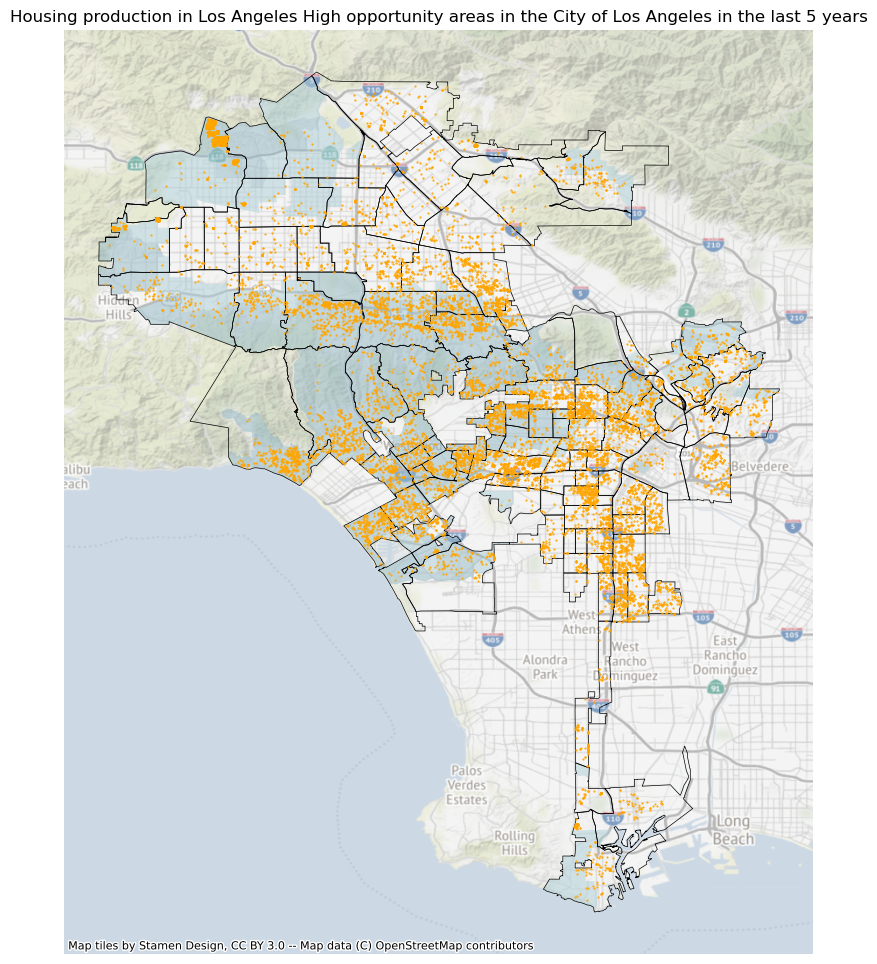

In [68]:
#now trying to map it all together
#plotting with neighborhood boundaries
#starting the plot
fig, ax = plt.subplots(figsize=(20,12))



#adding colour to the plot
TCAC_trimmed.plot(
            ax=ax,   
            column = 'oppcat',   # column that defines the color of the dots
            color = TCAC_trimmed['color'], #to color according to the TCAC values, based on a new column
            legend = True,     # add a legend        
            alpha = 0.5,
            legend_kwds={
               'loc': 'upper right',
               'bbox_to_anchor':(1,1),
            }
        
            )
neighborhoods.plot(
            ax=ax,                
            color = "none",        
            edgecolor = 'black',
            linewidth = 0.5,
            )
          
gdf_newunits_2016.plot(
            ax=ax,   
            markersize = 0.3, 
            color = 'orange',
            legend = True,     # add a legend 
            legend_kwds={
               'loc': 'upper right',
               'bbox_to_anchor':(1,1),
                'labels':'Housing units',
            }                  # this puts the legend to the side
) 
    
# turn the axes off
ax.axis('off')

# give it a title
ax.set_title('Housing production in Los Angeles High opportunity areas in the City of Los Angeles in the last 5 years')

# add a basemap at 40% transparency
ctx.add_basemap(ax, crs=4326, source=ctx.providers.Stamen.Terrain, alpha=0.5)



## Affordable Housing production in Los Angeles

### Filtering only affordable housing data from the permit data

In [69]:
#separating housing permits based on affordable housing permits. True = affordable housing project
newunits_trimmed['AFFD'].value_counts()

NOAH    19525
AH        176
Name: AFFD, dtype: int64

In [70]:
type(newunits_trimmed)

pandas.core.frame.DataFrame

In [71]:
newunits_trimmed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19701 entries, 0 to 25061
Data columns (total 11 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   Tract                            19636 non-null  object        
 1   Permit Type                      19701 non-null  object        
 2   Permit Sub-Type                  19701 non-null  object        
 3   Issue Date                       19701 non-null  datetime64[ns]
 4   # of Residential Dwelling Units  19701 non-null  int64         
 5   AFFD                             19701 non-null  object        
 6   Zone                             19675 non-null  object        
 7   Census Tract                     19699 non-null  float64       
 8   Latitude                         19701 non-null  float64       
 9   Longitude                        19701 non-null  float64       
 10  geometry                         19701 non-null  geometry 

In [72]:
#assigning colors to each project based on whether it was a affordable housing project or not
newunits_trimmed.loc[newunits_trimmed['AFFD'] == 'AH', 'color_AFFD'] = '#FA7B6E'
newunits_trimmed.loc[newunits_trimmed['AFFD'] == 'NOAH', 'color_AFFD'] = '#F0D256'

/tmp/ipykernel_305/2853130391.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  newunits_trimmed.loc[newunits_trimmed['AFFD'] == 'AH', 'color_AFFD'] = '#FA7B6E'


In [73]:
newunits_trimmed.sample(10)

,Tract,Permit Type,Permit Sub-Type,Issue Date,# of Residential Dwelling Units,AFFD,Zone,Census Tract,Latitude,Longitude,geometry,color_AFFD
2538,HAMILTON PLACE,Bldg-New,1 or 2 Family Dwelling,2014-09-24,1,NOAH,RD1.5-1,1816.00,34.13519,-118.21608,POINT (-118.21608 34.13519),#F0D256
6959,TR 12214,Bldg-New,1 or 2 Family Dwelling,2022-02-08,1,NOAH,R1-1,1439.01,34.14100,-118.40958,POINT (-118.40958 34.14100),#F0D256
13921,TR 3842,Bldg-New,1 or 2 Family Dwelling,2016-09-07,1,NOAH,R3-1,2723.02,34.00228,-118.42448,POINT (-118.42448 34.00228),#F0D256
15491,NORTON TRACT,Bldg-New,1 or 2 Family Dwelling,2018-11-29,1,NOAH,R1-1,1852.02,34.09367,-118.21761,POINT (-118.21761 34.09367),#F0D256
8638,TR 8467,Bldg-New,1 or 2 Family Dwelling,2022-02-10,1,NOAH,R1-1-CUGU,1211.02,34.22936,-118.36736,POINT (-118.36736 34.22936),#F0D256
15503,TR 16801,Bldg-New,1 or 2 Family Dwelling,2013-08-21,1,NOAH,RA-1,1397.03,34.15680,-118.51982,POINT (-118.51982 34.15680),#F0D256
11343,TR 5919,Bldg-New,1 or 2 Family Dwelling,2013-10-17,1,NOAH,R1-1,1862.01,34.12026,-118.22073,POINT (-118.22073 34.12026),#F0D256
12785,TR 9426,Bldg-New,1 or 2 Family Dwelling,2014-01-14,1,NOAH,RE15-1-H,1417.00,34.13545,-118.45186,POINT (-118.45186 34.13545),#F0D256
16972,TR 50505,Bldg-New,1 or 2 Family Dwelling,2021-08-03,1,NOAH,[T]RE-1,1082.02,34.29803,-118.58389,POINT (-118.58389 34.29803),#F0D256
12799,TR 61684,Bldg-New,1 or 2 Family Dwelling,2014-12-04,1,NOAH,R1-1,1397.01,34.15962,-118.49264,POINT (-118.49264 34.15962),#F0D256


In [97]:
gdf_newunits.sample(5)

,Tract,Permit Type,Permit Sub-Type,Issue Date,# of Residential Dwelling Units,AFFD,Zone,Census Tract,Latitude,Longitude,geometry
9376,TR 15018,Bldg-New,1 or 2 Family Dwelling,12/8/2015,1,NOAH,RE15-1-H,1415.00,34.14722,-118.48022,POINT (-118.48022 34.14722)
17937,TEMPLE STREET VILLA TRACT,Bldg-New,1 or 2 Family Dwelling,11/25/2019,2,NOAH,RD2-1VL,1958.02,34.07460,-118.27562,POINT (-118.27562 34.07460)
697,EDENDALE TRACT,Bldg-New,1 or 2 Family Dwelling,11/9/2016,1,NOAH,R2-1VL,1955.00,34.09158,-118.26081,POINT (-118.26081 34.09158)
659,P M 2014-3076,Bldg-New,1 or 2 Family Dwelling,10/16/2019,1,NOAH,NaN,2719.02,34.00808,-118.43395,POINT (-118.43395 34.00808)
19799,TR 5870,Bldg-New,1 or 2 Family Dwelling,8/2/2019,2,NOAH,R3-1-O,2183.00,34.04494,-118.34554,POINT (-118.34554 34.04494)


<AxesSubplot: >

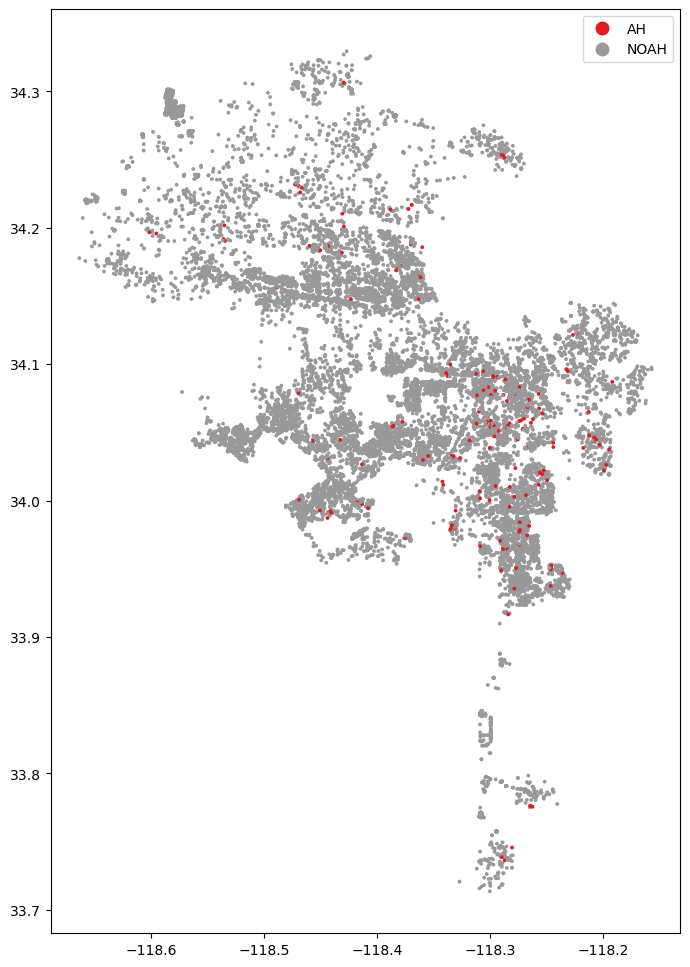

In [74]:
#making a lt with affordable and market rate units
gdf_newunits.plot(
            figsize=(20,12),   
            markersize = 3, 
            column = 'AFFD',
            cmap='Set1',
            legend = True,     # add a legend           
            legend_kwds={
               'loc': 'upper right',
               'bbox_to_anchor':(1,1)
            }                  # this puts the legend to the side
) 

In [75]:
#filtering only affordable housing projects
newunits_AH = newunits_trimmed.loc[newunits_trimmed['AFFD'] == 'AH']

In [76]:
newunits_AH.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 176 entries, 10984 to 24977
Data columns (total 12 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   Tract                            175 non-null    object        
 1   Permit Type                      176 non-null    object        
 2   Permit Sub-Type                  176 non-null    object        
 3   Issue Date                       176 non-null    datetime64[ns]
 4   # of Residential Dwelling Units  176 non-null    int64         
 5   AFFD                             176 non-null    object        
 6   Zone                             176 non-null    object        
 7   Census Tract                     176 non-null    float64       
 8   Latitude                         176 non-null    float64       
 9   Longitude                        176 non-null    float64       
 10  geometry                         176 non-null    geometr

In [77]:
#converting the new dataset newunits_AH from df to gdf
gdf_newunits_AH = gpd.GeoDataFrame(newunits_AH, 
                       crs='epsg:4326',
                       geometry=gpd.points_from_xy(newunits_AH.Longitude, newunits_AH.Latitude))

<AxesSubplot: >

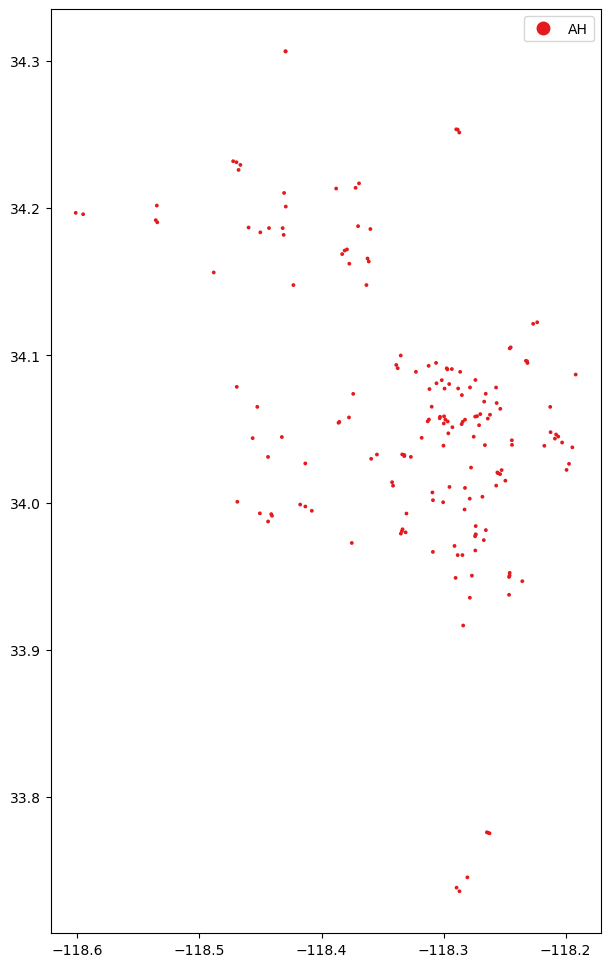

In [78]:
gdf_newunits_AH.plot(
                    figsize=(20,12),   
                    markersize = 3, 
                    column = 'AFFD',
                    cmap='Set1',
                    legend = True,     # add a legend           
                    legend_kwds={
                       'loc': 'upper right',
                       'bbox_to_anchor':(1,1)
                    }                  # this puts the legend to the side
)  

/opt/conda/lib/python3.10/site-packages/geopandas/plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


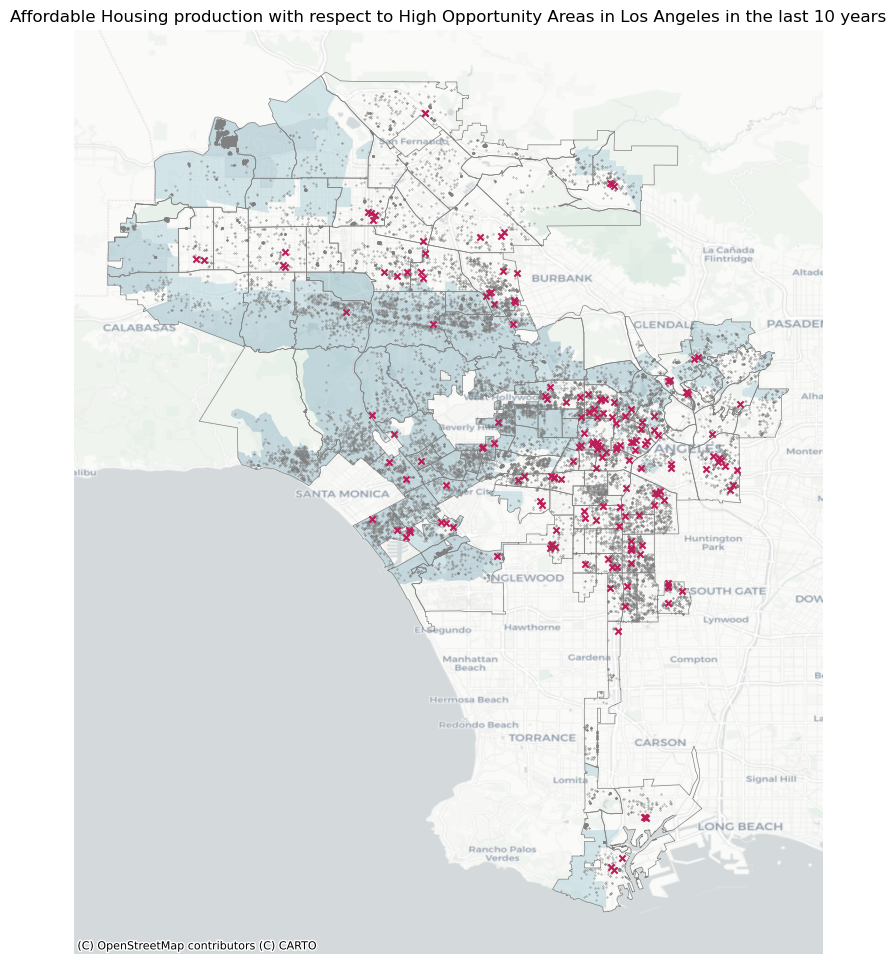

In [79]:
#now trying to map it all together
#plotting with neighborhood boundaries
#starting the plot
fig, ax = plt.subplots(figsize=(20,12))



#adding colour to the plot
TCAC_trimmed.plot(
            ax=ax,   
            column = 'oppcat',   # column that defines the color of the dots
            color = TCAC_trimmed['color'],
            legend = True,     # add a legend        
            alpha = 0.5,
            legend_kwds={
               'loc': 'upper right',
               'bbox_to_anchor':(1,1),
            }
        
            )
neighborhoods.plot(
            ax=ax,                
            color = "none",        
            edgecolor = 'grey',
            linewidth = 0.5,
            )

gdf_newunits.plot(
            ax = ax,   
            markersize = 0.1,
            alpha = 1,
            column = 'AFFD',
            color = 'grey',
            legend = True,     # add a legend           
            legend_kwds={
               'loc': 'upper right',
               'bbox_to_anchor':(1,1)
            }                  # this puts the legend to the side
) 

gdf_newunits_AH.plot(
                    ax = ax,   
                    marker= "x",
                    markersize = 20, 
                    column = 'AFFD',
                    color = '#bc1d59ff',
                    legend = True,     # add a legend           
                    legend_kwds={
                       'loc': 'upper right',
                       'bbox_to_anchor':(1,1)
                    }                  # this puts the legend to the side
)  

    
# turn the axes off
ax.axis('off')

# give it a title
ax.set_title('Affordable Housing production with respect to High Opportunity Areas in Los Angeles in the last 10 years')

# add a basemap at 40% transparency
ctx.add_basemap(ax,crs=4326,source=ctx.providers.CartoDB.Positron)



In [80]:
#creating a dataset with only affordable housing 
gdf_newunitsAH_2016 = gdf_newunits_2016.loc[gdf_newunits_2016['AFFD'] == 'AH']
gdf_newunitsAH_2016.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 143 entries, 10984 to 24977
Data columns (total 11 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   Tract                            142 non-null    object        
 1   Permit Type                      143 non-null    object        
 2   Permit Sub-Type                  143 non-null    object        
 3   Issue Date                       143 non-null    datetime64[ns]
 4   # of Residential Dwelling Units  143 non-null    int64         
 5   AFFD                             143 non-null    object        
 6   Zone                             143 non-null    object        
 7   Census Tract                     143 non-null    float64       
 8   Latitude                         143 non-null    float64       
 9   Longitude                        143 non-null    float64       
 10  geometry                         143 non-null   

In [81]:
gdf_newunitsAH_2016.sample(5)

,Tract,Permit Type,Permit Sub-Type,Issue Date,# of Residential Dwelling Units,AFFD,Zone,Census Tract,Latitude,Longitude,geometry
24210,MELTON TERRACE TRACT,Bldg-New,Apartment,2018-10-23,34,AH,C2-1VL,1957.20,34.07393,-118.26551,POINT (-118.26551 34.07393)
24278,TR 4830,Bldg-New,Apartment,2020-12-17,38,AH,C2-1-O-SP,2187.02,34.03238,-118.33225,POINT (-118.33225 34.03238)
24078,THE MC CARTHY COMPANY'S GREATER LOS ANGELES TRACT,Bldg-New,Apartment,2020-01-16,28,AH,C2-1VL-CPIO,2393.30,33.98137,-118.26542,POINT (-118.26542 33.98137)
24372,TR 7502,Bldg-New,Apartment,2022-04-14,44,AH,R5-2,2123.04,34.05863,-118.29964,POINT (-118.29964 34.05863)
24640,WRIGHT'S ADDITION TO OCEAN PARK,Bldg-New,Apartment,2017-05-18,68,AH,CM(GM)-2D-CA,2754.00,33.98723,-118.44380,POINT (-118.44380 33.98723)


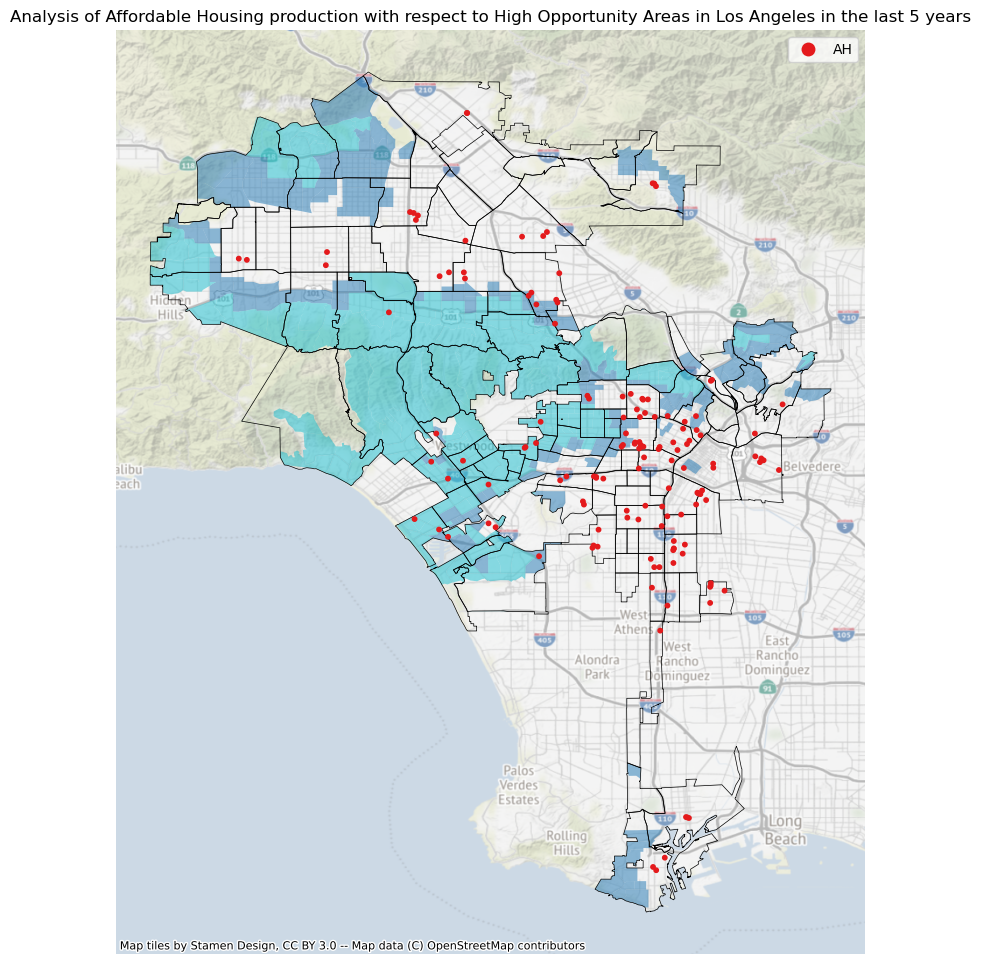

In [82]:
#plotting affordable housing projects within the last 5 years
fig, ax = plt.subplots(figsize=(20,12))



#adding colour to the plot
TCAC_trimmed.plot(
            ax=ax,   
            column = 'oppcat',   # column that defines the color of the dots
            legend = True,     # add a legend        
            alpha = 0.5,
            legend_kwds={
               'loc': 'upper right',
               'bbox_to_anchor':(1,1),
            }
        
            )
neighborhoods.plot(
            ax=ax,                
            color = "none",        
            edgecolor = 'black',
            linewidth = 0.5,
            )


gdf_newunitsAH_2016.plot(
                    ax = ax,   
                    markersize = 10, 
                    column = 'AFFD',
                    cmap='Set1',
                    legend = True,     # add a legend           
                    legend_kwds={
                       'loc': 'upper right',
                       'bbox_to_anchor':(1,1)
                    }                  # this puts the legend to the side
)  

    
# turn the axes off
ax.axis('off')

# give it a title
ax.set_title('Analysis of Affordable Housing production with respect to High Opportunity Areas in Los Angeles in the last 5 years')

# add a basemap at 40% transparency
ctx.add_basemap(ax, crs=4326, source=ctx.providers.Stamen.Terrain, alpha=0.5)



In [83]:
#doing a spatial join to get all the data in one data set to generate charts
#before doing that, check if all are in the same crs
TCAC_trimmed.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [84]:
neighborhoods.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [85]:
gdf_newunitsAH_2016.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [86]:
#To get the distribution of high resource areas per neighborhood, lets see if we can do a plot with TCAC tracts per neighborhood after doing a spatial join
TCAC_nb = gpd.sjoin(neighborhoods, TCAC_trimmed) #Spatial join 
TCAC_nb.sample(5)

,OBJECTID_left,name,geometry,index_right,OBJECTID_right,CITY,fips,cnty_nm,oppcat,color
95,96,Valley Village,"POLYGON ((-118.37928 34.15687, -118.37769 34.1...",203,1,IN,06037124902,Los Angeles,High Resource,#aed0d9ff
97,98,Venice,"MULTIPOLYGON (((-118.45619 33.96247, -118.4573...",905,1,IN,06037273300,Los Angeles,Highest Resource,#93b9c6ff
108,109,Westwood,"POLYGON ((-118.42946 34.07925, -118.42938 34.0...",854,1,IN,06037265601,Los Angeles,Highest Resource,#93b9c6ff
49,50,Hollywood,"POLYGON ((-118.32802 34.10545, -118.32688 34.1...",447,1,IN,06037192410,Los Angeles,High Resource,#aed0d9ff
25,26,East Hollywood,"POLYGON ((-118.28740 34.09836, -118.28740 34.0...",577,1,IN,06037211121,Los Angeles,High Resource,#aed0d9ff


In [87]:
#Sort top ten neighborhoods for low housing and plot by race 
sorted2=TCAC_nb.sort_values(by='name', ascending=False,)
sorted2.head(10)

,OBJECTID_left,name,geometry,index_right,OBJECTID_right,CITY,fips,cnty_nm,oppcat,color
112,113,Woodland Hills,"POLYGON ((-118.57240 34.18668, -118.57161 34.1...",297,1,IN,06037135113,Los Angeles,High Resource,#aed0d9ff
112,113,Woodland Hills,"POLYGON ((-118.57240 34.18668, -118.57161 34.1...",301,1,IN,06037135203,Los Angeles,Highest Resource,#93b9c6ff
112,113,Woodland Hills,"POLYGON ((-118.57240 34.18668, -118.57161 34.1...",299,1,IN,06037135201,Los Angeles,Highest Resource,#93b9c6ff
112,113,Woodland Hills,"POLYGON ((-118.57240 34.18668, -118.57161 34.1...",306,1,IN,06037137302,Los Angeles,Highest Resource,#93b9c6ff
112,113,Woodland Hills,"POLYGON ((-118.57240 34.18668, -118.57161 34.1...",311,1,IN,06037137504,Los Angeles,Highest Resource,#93b9c6ff
112,113,Woodland Hills,"POLYGON ((-118.57240 34.18668, -118.57161 34.1...",328,1,IN,06037139802,Los Angeles,Highest Resource,#93b9c6ff
112,113,Woodland Hills,"POLYGON ((-118.57240 34.18668, -118.57161 34.1...",1123,1,IN,06037800102,Los Angeles,Highest Resource,#93b9c6ff
112,113,Woodland Hills,"POLYGON ((-118.57240 34.18668, -118.57161 34.1...",295,1,IN,06037135102,Los Angeles,High Resource,#aed0d9ff
112,113,Woodland Hills,"POLYGON ((-118.57240 34.18668, -118.57161 34.1...",319,1,IN,06037139402,Los Angeles,High Resource,#aed0d9ff
112,113,Woodland Hills,"POLYGON ((-118.57240 34.18668, -118.57161 34.1...",309,1,IN,06037137501,Los Angeles,High Resource,#aed0d9ff


In [88]:
#creating a dataset using th value counts based on number of high and highest resource census tracts in neighborhoods
TCAC_nb_stacked = TCAC_nb.value_counts(['name']).reset_index(name='count')
TCAC_nb_stacked.sample(5)

,name,count
46,Mount Washington,7
53,Century City,5
36,North Hollywood,10
3,Hollywood,22
22,Silver Lake,13


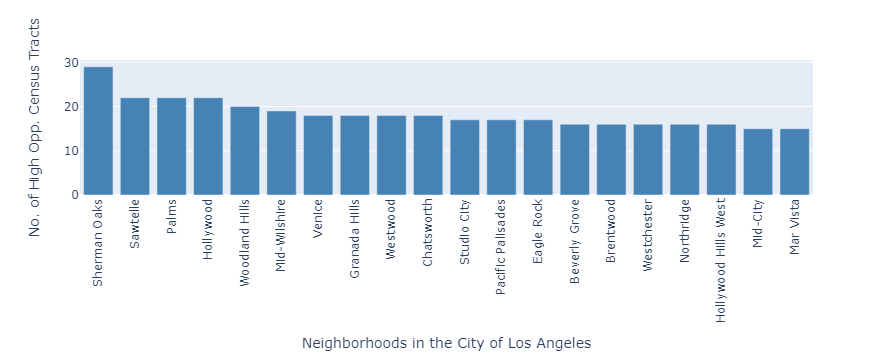

In [89]:
# make a stacked bar chart of high and highest resource census tracts per neighborhoods
import plotly.express as px
fig = px.bar(TCAC_nb_stacked[:20],
       x='name',
       y='count',
        color_discrete_sequence =['steelblue']*3,
             
        labels={
            'name':'Neighborhoods in the City of Los Angeles',
            'count':'No. of High Opp. Census Tracts'
        }
)
fig.update_xaxes(tickangle=-90)
fig.show()

In [90]:
#since they are in the same coordinate system, lets do a spatial join of affordable housing and neighborhood data
AH_nb = gpd.sjoin(neighborhoods, gdf_newunits_AH) #Spatial join 
AH_nb.sample(5)

,OBJECTID,name,geometry,index_right,Tract,Permit Type,Permit Sub-Type,Issue Date,# of Residential Dwelling Units,AFFD,Zone,Census Tract,Latitude,Longitude,color_AFFD
106,107,Westlake,"POLYGON ((-118.25908 34.05389, -118.25984 34.0...",24499,WEST END TERRACE,Bldg-New,Apartment,2014-03-18,52,AH,(T)(Q)C2-2,2094.01,34.05636,-118.28248,#FA7B6E
12,13,Canoga Park,"POLYGON ((-118.58854 34.23305, -118.58853 34.2...",24707,OWENSMOUTH,Bldg-New,Apartment,2020-11-18,80,AH,RAS4-1VL-RIO,1345.20,34.19677,-118.60139,#FA7B6E
85,86,South Park,"POLYGON ((-118.28040 33.98916, -118.28061 33.9...",24340,WALNUT PARK,Bldg-New,Apartment,2020-12-07,41,AH,C2-2D-CPIO,2319.00,34.00271,-118.27861,#FA7B6E
46,47,Historic South-Central,"POLYGON ((-118.26575 34.03147, -118.26361 34.0...",24152,GRIDER AND DOW'S ORANGEDALE TRACT,Bldg-New,Apartment,2021-11-10,31,AH,C2-2D-CPIO,2264.20,34.01995,-118.25538,#FA7B6E
103,104,West Adams,"POLYGON ((-118.36955 34.03517, -118.36860 34.0...",24822,TR 1566,Bldg-New,Apartment,2020-09-14,115,AH,C2-2D-CPIO,2198.00,34.03267,-118.35464,#FA7B6E


<AxesSubplot: >

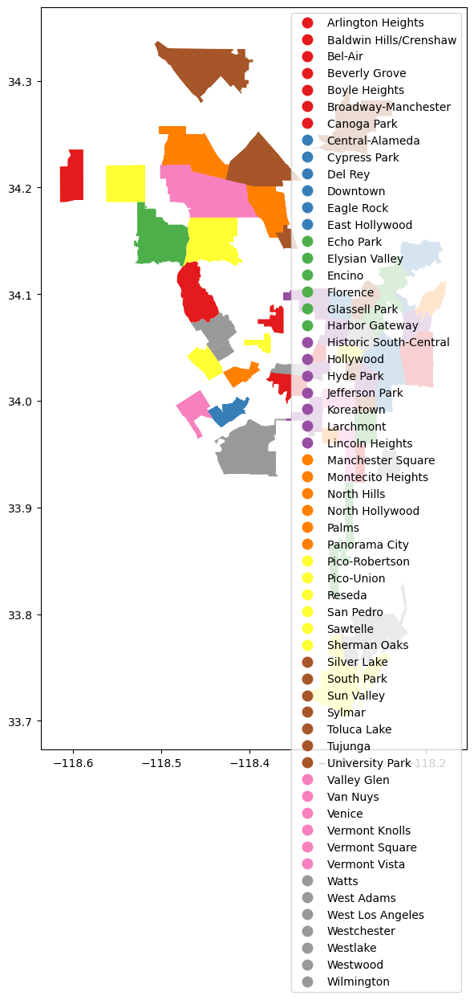

In [91]:
AH_nb.plot( figsize=(20,12),    
                    column = 'name',
                    cmap='Set1',
                    legend = True,     # add a legend           
                    legend_kwds={
                       'loc': 'upper right',
                       'bbox_to_anchor':(1,1)
                    }                  # this puts the legend to the side
)  

In [92]:
#creating a dataset using th value counts based on number of affordable housing units built after 2015, per neighborhoods
AH_nb_sorted = AH_nb.value_counts(['name','AFFD']).reset_index(name='count')
AH_nb_sorted.sample(5)

,name,AFFD,count
45,Lincoln Heights,AH,1
1,East Hollywood,AH,10
9,Hollywood,AH,5
0,Westlake,AH,11
28,Sawtelle,AH,2


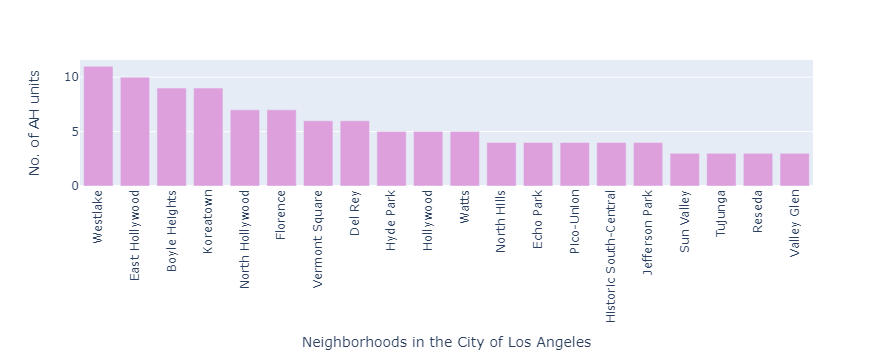

In [93]:
# make a stacked bar chart of the number of affordable housing projects built per neighborhood
import plotly.express as px
fig = px.bar(AH_nb_sorted[:20],
       x='name',
       y='count',
       color_discrete_sequence =['plum']*3,

        labels={
            'name':'Neighborhoods in the City of Los Angeles',
            'count':'No. of AH units'
        }
)
fig.update_xaxes(tickangle=-90)
fig.show()

## Point analysis

In [94]:
# new for data viz
import seaborn as sns

# to explore point patterns
from matplotlib.patches import Ellipse
import numpy

In [96]:
# manually install this library first
!pip install pointpats

  Using cached pointpats-2.3.0-py3-none-any.whl (59 kB)


In [99]:
# seaborn needs an x and y column so let's extract it from the geometry field
gdf_newunits['x'] = gdf_newunits.geometry.x
gdf_newunits['y'] = gdf_newunits.geometry.y

In [100]:
gdf_newunits.sample()

,Tract,Permit Type,Permit Sub-Type,Issue Date,# of Residential Dwelling Units,AFFD,Zone,Census Tract,Latitude,Longitude,geometry,x,y
17706,MARIE STUART'S OMAHA HEIGHTS TRACT,Bldg-New,1 or 2 Family Dwelling,12/12/2022,1,NOAH,R1-1,1862.03,34.11758,-118.20816,POINT (-118.20816 34.11758),-118.20816,34.11758


In [109]:
gdf_newunits.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [110]:
gdf_newunits = gdf_newunits.to_crs(epsg=3857)

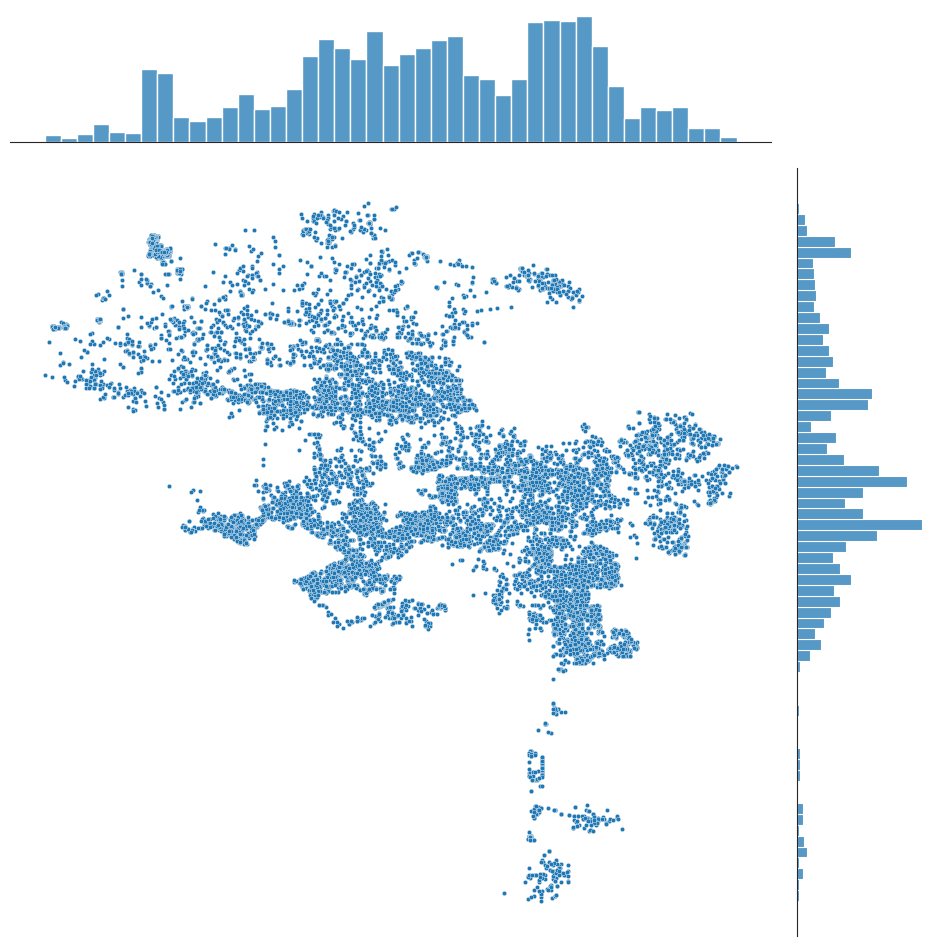

In [111]:
# add a basemap to jointplots
# scatterplot with edges
sns.set_style('white')
g = sns.jointplot(data = gdf_newunits,
                  x='x', 
                  y='y',
                  s=10,
                  height=10 # make the map bigger
                 )

# Clean axes (optional)
g.ax_joint.set_axis_off()


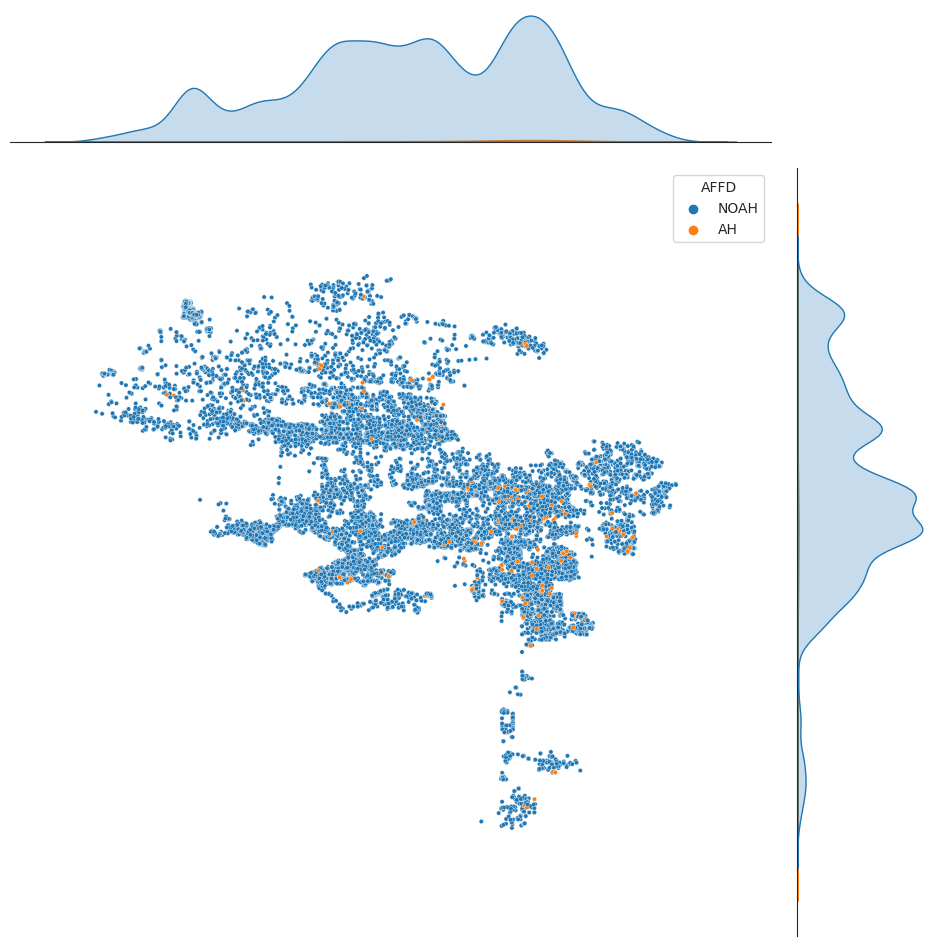

In [112]:
# color code by race
g = sns.jointplot(data = gdf_newunits,
                  x='x', 
                  y='y',
                  hue='AFFD',
                  s=10,
                  height=10 # make the map bigger
                 )

# Clean axes
g.ax_joint.set_axis_off()





/opt/conda/lib/python3.10/site-packages/contextily/tile.py:581: UserWarning:

The inferred zoom level of 28 is not valid for the current tile provider (valid zooms: 0 - 20).



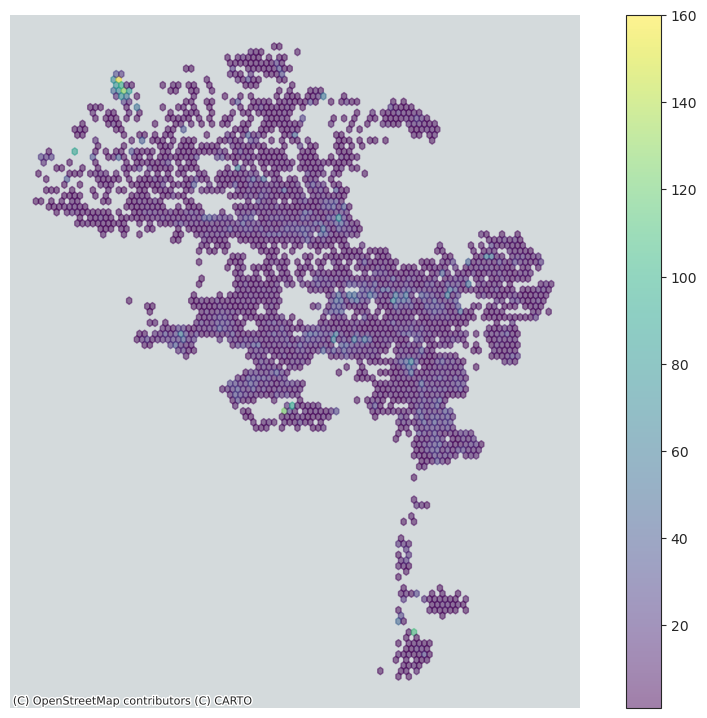

In [108]:
# Set up figure and axis
f, ax = plt.subplots(figsize=(12, 9))

# Generate and add hexbin with 50 hexagons in each 
# dimension, half transparency, ommitting grids with no crime,
# and using the viridis colormap
hb = ax.hexbin(
    x = gdf_newunits['x'], 
    y = gdf_newunits['y'],
    gridsize=100, 
    linewidths=1,
    alpha=0.5, 
    mincnt=1, # don't show zero
    cmap='viridis'
)

# Add basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

# Add colorbar
plt.colorbar(hb)

# Remove axes
ax.axis('off');

In [113]:
#now lets try the same for only AH
# seaborn needs an x and y column so let's extract it from the geometry field
gdf_newunits_AH['x'] = gdf_newunits_AH.geometry.x
gdf_newunits_AH['y'] = gdf_newunits_AH.geometry.y

In [114]:
gdf_newunits_AH = gdf_newunits_AH.to_crs(epsg=3857)

/opt/conda/lib/python3.10/site-packages/contextily/tile.py:581: UserWarning:

The inferred zoom level of 28 is not valid for the current tile provider (valid zooms: 0 - 18).



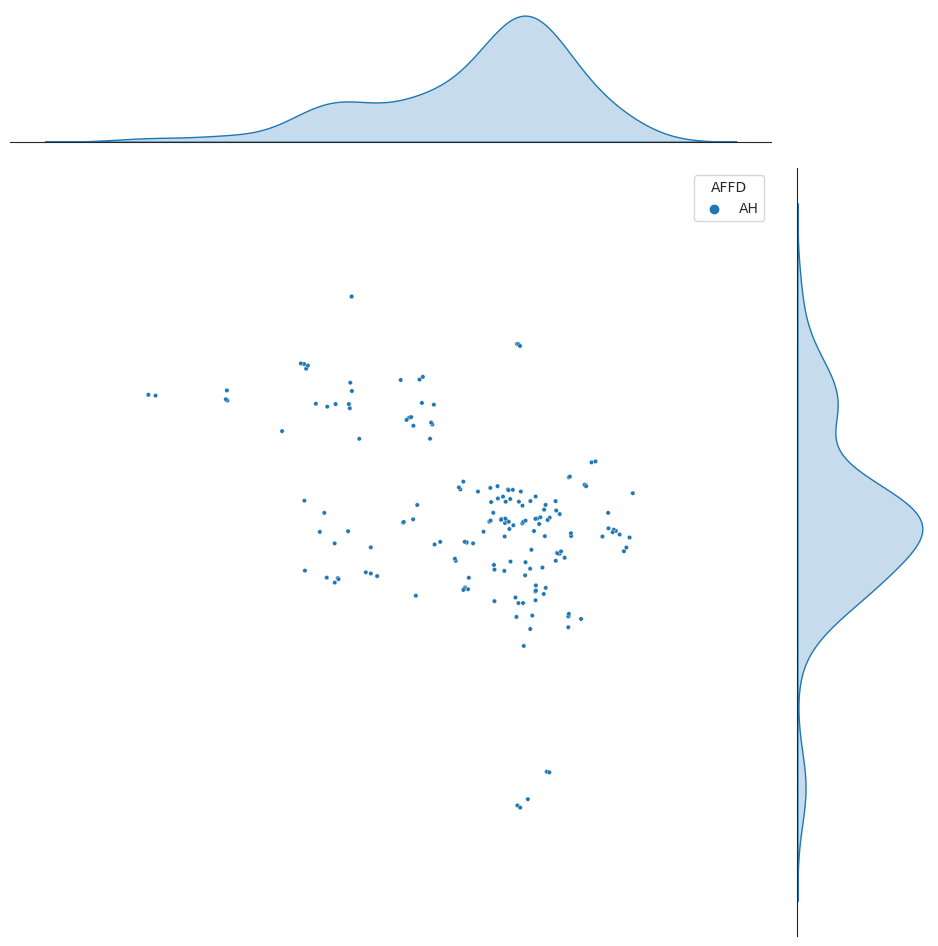

In [120]:
# color code by race
g = sns.jointplot(data = gdf_newunits_AH,
                  x='x', 
                  y='y',
                  hue='AFFD',
                  s=10,
                  height=10 # make the map bigger
                 )

# Clean axes
g.ax_joint.set_axis_off()

# add basemap
ctx.add_basemap(ax, crs=3857, source=ctx.providers.Stamen.Terrain, alpha=0.5)
